# Installation and Set Up

In [2]:
!java -version

openjdk version "17.0.13" 2024-10-15 LTS
OpenJDK Runtime Environment Microsoft-10376486 (build 17.0.13+11-LTS)
OpenJDK 64-Bit Server VM Microsoft-10376486 (build 17.0.13+11-LTS, mixed mode, sharing)


In [3]:
%pip show h2o

Name: h2o
Version: 3.46.0.6
Summary: H2O, Fast Scalable Machine Learning, for python 
Home-page: https://github.com/h2oai/h2o-3.git
Author: H2O.ai
Author-email: support@h2o.ai
License: Apache v2
Location: d:\OneDrive\Repos\employee-attrition-ibm\.venv\Lib\site-packages
Requires: requests, tabulate
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [4]:
# Importing relevant modules
import h2o
from h2o.automl import H2OAutoML
import time
import datetime

# Load Data

In [5]:
# Start the H2O cluster (locally)
h2o.init()

# Import a sample binary outcome train/test set into H2O
train = h2o.import_file("../data/processed/train_set.csv")
test = h2o.import_file("../data/processed/test_set.csv")

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
; OpenJDK 64-Bit Server VM Microsoft-10376486 (build 17.0.13+11-LTS, mixed mode, sharing)
  Starting server from D:\OneDrive\Repos\employee-attrition-ibm\.venv\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\user\AppData\Local\Temp\tmpp3skwtfo
  JVM stdout: C:\Users\user\AppData\Local\Temp\tmpp3skwtfo\h2o_user_started_from_python.out
  JVM stderr: C:\Users\user\AppData\Local\Temp\tmpp3skwtfo\h2o_user_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.
Please download and install the latest version from: https://h2o-release.s3.amazonaws.com/h2o/latest_stable.html


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Asia/Kuala_Lumpur
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.6
H2O_cluster_version_age:,4 months and 24 days
H2O_cluster_name:,H2O_from_python_user_p8tgz0
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,2.971 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [6]:
# Filter integer columns
int_columns = [col for col, dtype in test.types.items() if dtype == "int"]

# Convert all integer columns to factors in training and testing dataset
for col in int_columns:
    test[col] = test[col].asfactor()
    train[col] = train[col].asfactor()

In [7]:
# Identify predictors and response
x = train.columns
y = "Attrition"
x.remove(y)

# AutoML

In [8]:
# Start timing AutoML training
start = time.time()

print("AutoML started at:"+datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S"))

# Run AutoML for 20 base models
aml = H2OAutoML(sort_metric="logloss",
                nfolds=5,
                seed=1,
                max_runtime_secs=0,
                max_models=70)
aml.train(x=x, y=y, training_frame=train)
# Documentation: https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html

print("AutoML completed at:"+datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S"))
# print the time used to train AutoML
print('Time used (seconds): ',time.time()-start)

AutoML started at:2025-03-26_19-41-22
AutoML progress: |
19:41:24.393: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%
AutoML completed at:2025-03-26_20-45-57
Time used (seconds):  3875.0040550231934


# CV performance

In [9]:
# View the AutoML Leaderboard based on CV performance
lb = aml.leaderboard
lb.head(rows=lb.nrows)  # Print all rows instead of default (10 rows)

model_id,logloss,auc,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_1_AutoML_1_20250326_194124,0.345982,0.82271,0.605519,0.275324,0.320388,0.102649
GLM_1_AutoML_1_20250326_194124,0.355827,0.815499,0.601259,0.237848,0.322771,0.104181
StackedEnsemble_BestOfFamily_1_AutoML_1_20250326_194124,0.355955,0.809518,0.591012,0.256792,0.324959,0.105598
DeepLearning_1_AutoML_1_20250326_194124,0.370297,0.812214,0.571778,0.254594,0.333886,0.11148
DeepLearning_grid_3_AutoML_1_20250326_194124_model_14,0.372497,0.789484,0.547551,0.270171,0.333093,0.110951
GBM_grid_1_AutoML_1_20250326_194124_model_4,0.378477,0.781324,0.514762,0.271172,0.339875,0.115515
GBM_grid_1_AutoML_1_20250326_194124_model_11,0.378901,0.782146,0.503208,0.28245,0.341071,0.11633
GBM_grid_1_AutoML_1_20250326_194124_model_10,0.379727,0.783562,0.505016,0.297114,0.340194,0.115732
GBM_grid_1_AutoML_1_20250326_194124_model_14,0.383598,0.783314,0.513312,0.28194,0.343151,0.117752
GBM_grid_1_AutoML_1_20250326_194124_model_3,0.384699,0.768188,0.497137,0.285463,0.342435,0.117262


In [10]:
# Get the best model based on CV performance
cv_best_model = aml.leader
# Display training and CV performance
cv_best_model

key,value
Stacking strategy,cross_validation
Number of base models (used / total),13/70
# GBM base models (used / total),3/19
# GLM base models (used / total),0/1
# DeepLearning base models (used / total),10/48
# DRF base models (used / total),0/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


# Test Performance of Best Model from CV

In [11]:
# Get threshold at max f1 in CV
max_f1_threshold = cv_best_model.find_threshold_by_max_metric(xval=True, metric="f1")

# Check model performance on test data at threshold
perf = cv_best_model.model_performance(test_data=test)

# Print confusion matrix
perf.confusion_matrix(thresholds=max_f1_threshold)

Could not find exact threshold 0.40397453072105804; using closest threshold found 0.407091458420444.


,0,1,Error,Rate
0,370.0,14.0,0.0365,(14.0/384.0)
1,25.0,32.0,0.4386,(25.0/57.0)
Total,395.0,46.0,0.0884,(39.0/441.0)


In [12]:
predictions = cv_best_model.predict(test)

# Apply your desired threshold
threshold = max_f1_threshold
predictions["custom_pred"] = (predictions["p1"] >= threshold).ifelse(1, 0)

predictions

stackedensemble prediction progress: |

███████████████████████████████████████████| (done) 100%


predict,p0,p1,custom_pred
1,0.019804,0.980196,1
0,0.991404,0.00859568,0
0,0.932683,0.0673175,0
0,0.978694,0.0213065,0
0,0.998687,0.00131341,0
0,0.999873,0.000127349,0
1,0.128069,0.871931,1
0,0.999897,0.000102671,0
0,0.999474,0.000526382,0
0,0.880305,0.119695,0


In [13]:
# Print performance on test data
perf

ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.07353237980074356
RMSE: 0.2711685450061337
LogLoss: 0.3181176554871234
AUC: 0.8728298611111112
AUCPR: 0.6587903002653701
Gini: 0.7456597222222223
Null degrees of freedom: 440
Residual degrees of freedom: 427
Null deviance: 346.41975691703306
Residual deviance: 280.5797721396423
AIC: 308.5797721396423

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4597925747954668
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      373  11   0.0286   (11.0/384.0)
1      25   32   0.4386   (25.0/57.0)
Total  398  43   0.0816   (36.0/441.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.459793     0.64      42
max f2                       0.028243     0.635593  125
max f0point5                 0.522181     0.701357  40
max accuracy                 0.522181     0.918367  40
max precision                0.999287     1         0
max recall                   0.000218137  1         326
max specificity              0.999287     1         0
max absolute_mcc             0.459793     0.6025    42
max min_per_class_accuracy   0.028243     0.789062  125
max mean_per_class_accuracy  0.028243     0.789268  125
max tns                      0.999287     384       0
max fns                      0.999287     56        0
max fps                      5.78372e-05  384       399
max tps                      0.000218137  57        326
max tnr                      0.999287     1         0
max fnr                      0.999287     0.982456  0
max fpr                      5.78372e-05  1         399
max tpr                      0.000218137  1         326

Gains/Lift Table: Avg response rate: 12.93 %, avg score: 10.83 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score        cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  -----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0113379                   0.994572           7.73684   7.73684            1                0.99697      1                           0.99697             0.0877193       0.0877193                  673.684   673.684            0.0877193
2        0.0204082                   0.979564           7.73684   7.73684            1                0.98964      1                           0.993712            0.0701754       0.157895                   673.684   673.684            0.157895
3        0.031746                    0.949444           7.73684   7.73684            1                0.970863     1                           0.985551            0.0877193       0.245614                   673.684   673.684            0.245614
4        0.0408163                   0.92495            3.86842   6.87719            0.5              0.936674     0.888889                    0.97469             0.0350877       0.280702                   286.842   587.719            0.275493
5        0.0521542                   0.871931           6.18947   6.72769            0.8              0.901011     0.869565                    0.958673            0.0701754       0.350877                   518.947   572.769            0.343065
6        0.102041                    0.450495           4.2201    5.50175            0.545455         0.619072     0.711111                    0.792646            0.210526        0.561404                   322.01    450.175            0.527549
7        0.151927                    0.18452            1.4067    4.15711            0.181818         0.287278     0.537313                    0.6267

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_AllModels_1_AutoML_1_20250326_194124

,0,1,Error,Rate
0,373.0,11.0,0.0286,(11.0/384.0)
1,25.0,32.0,0.4386,(25.0/57.0)
Total,398.0,43.0,0.0816,(36.0/441.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

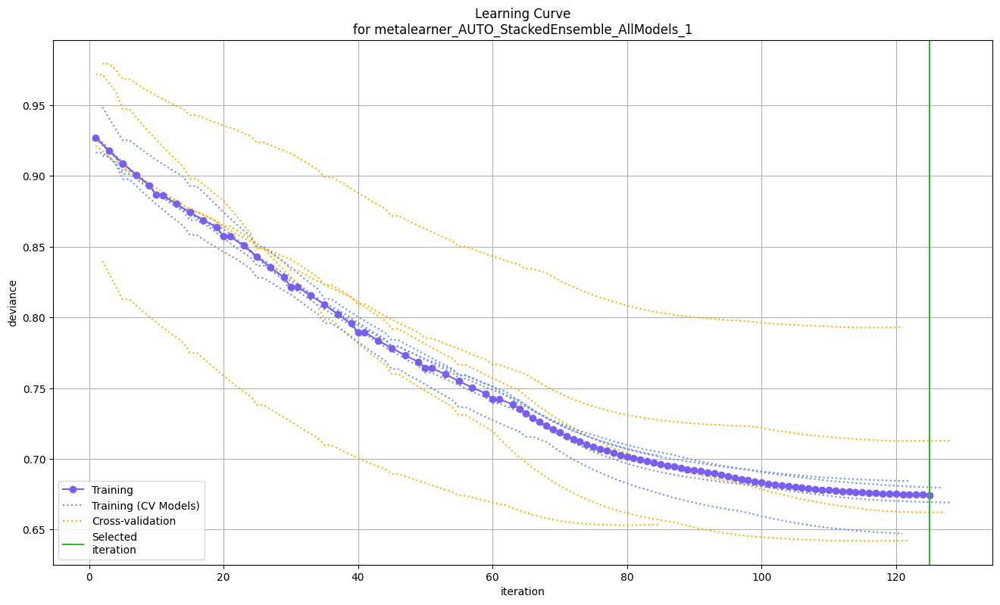

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

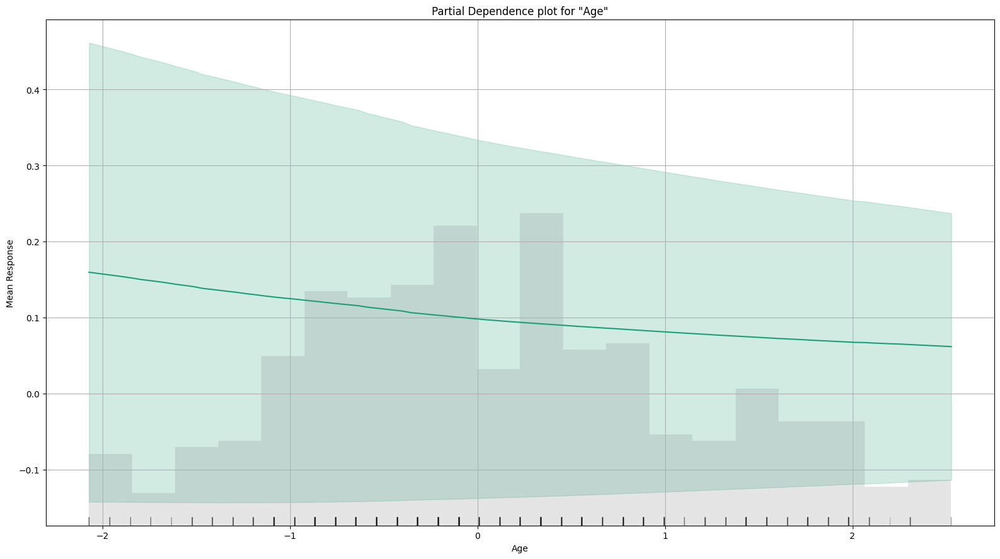

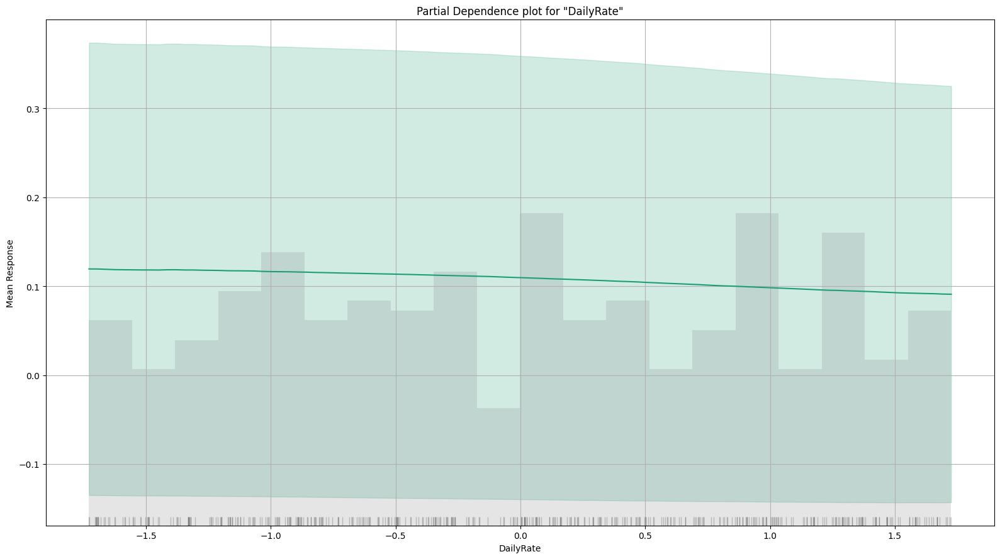

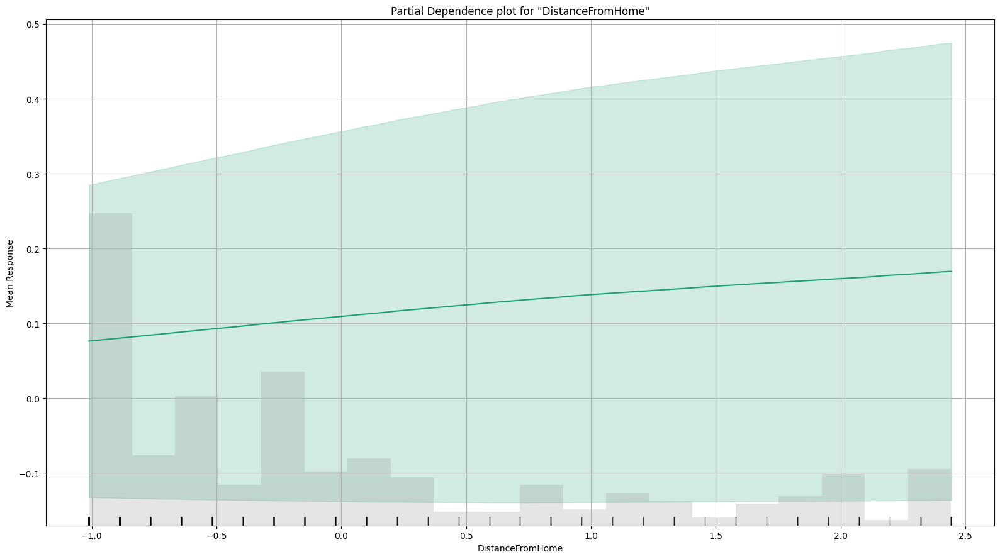

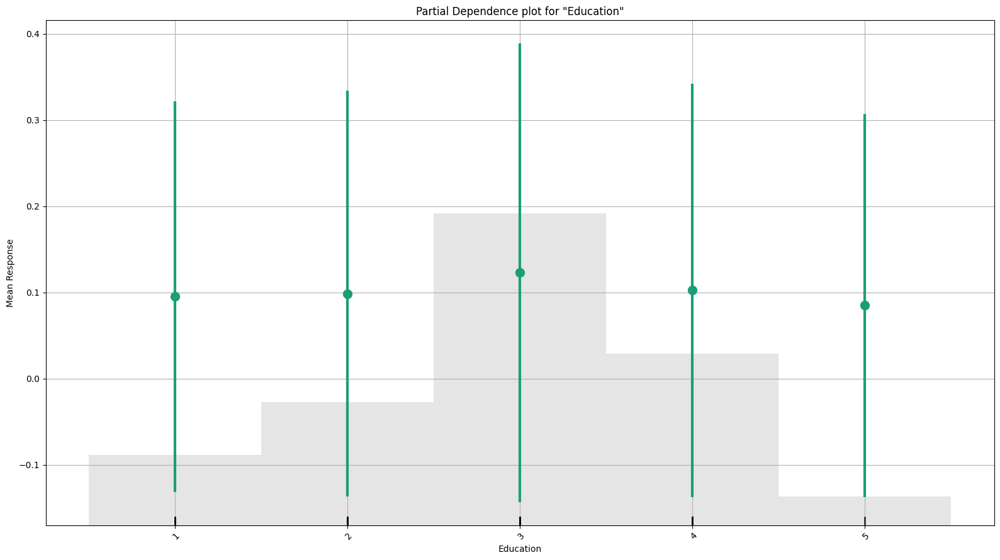

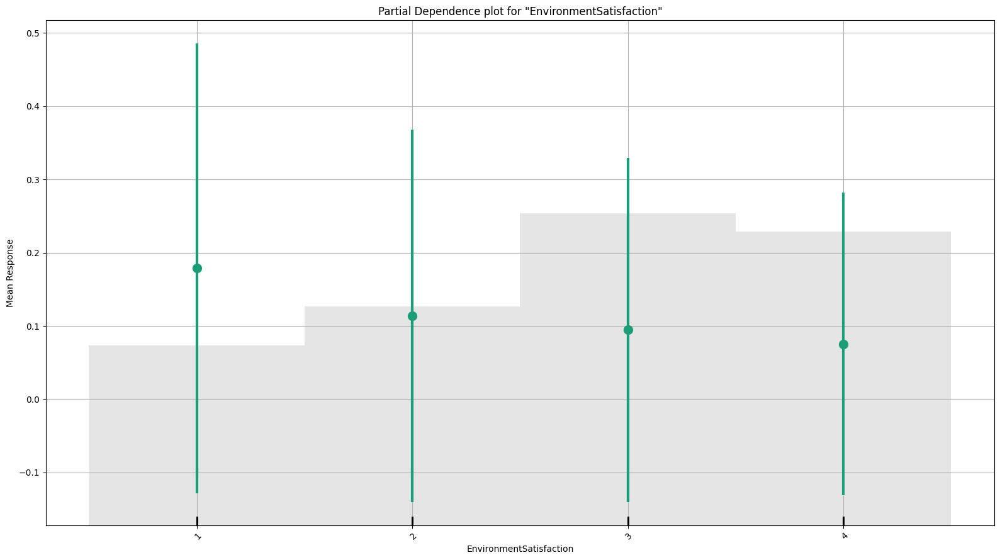

...

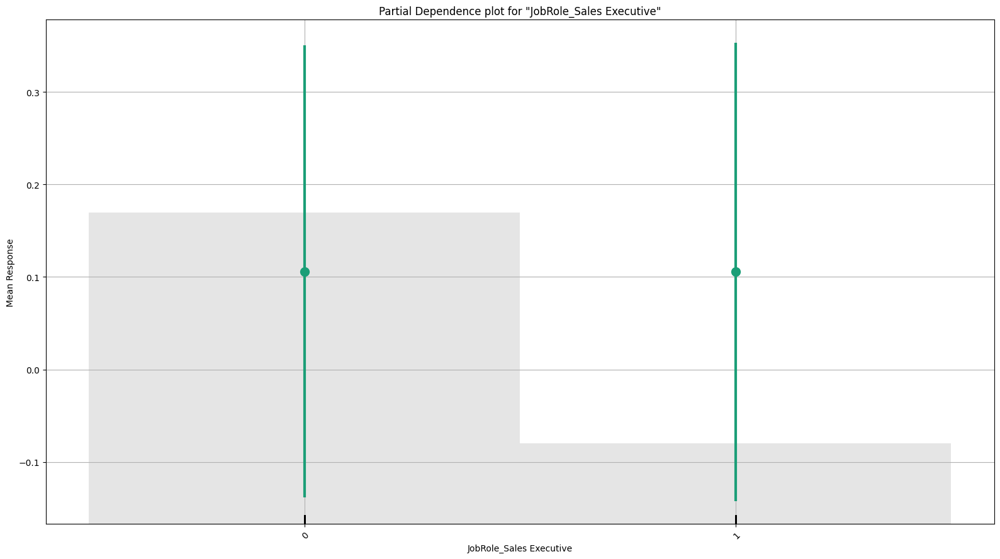

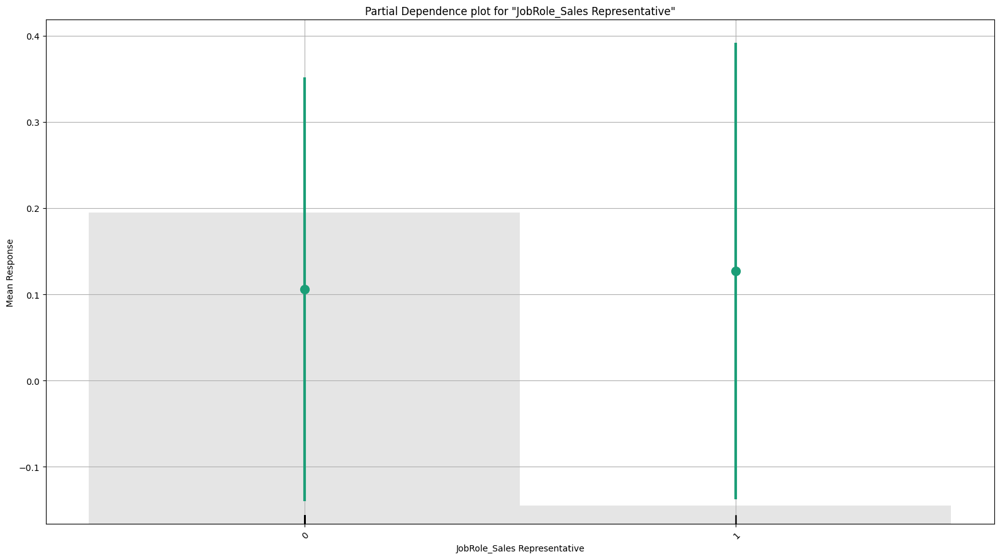

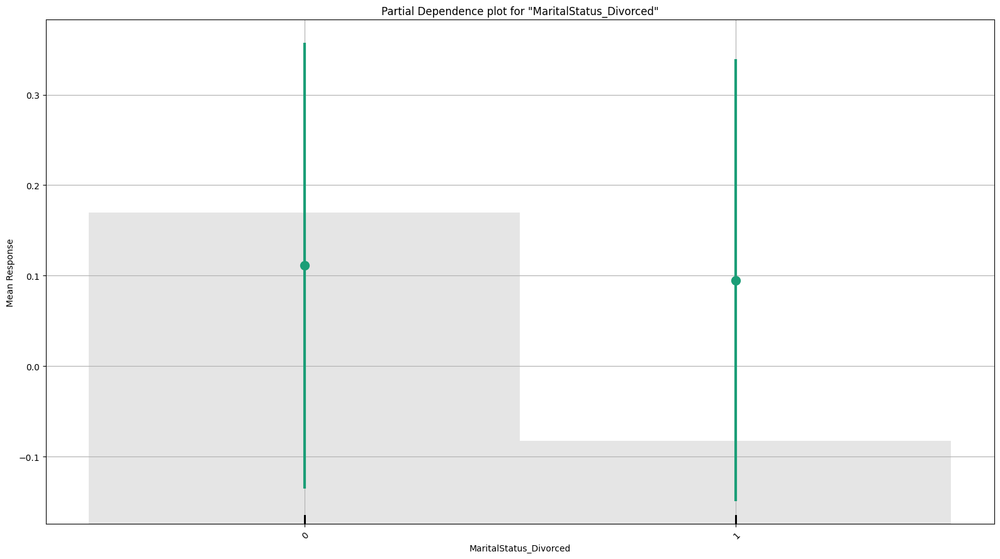

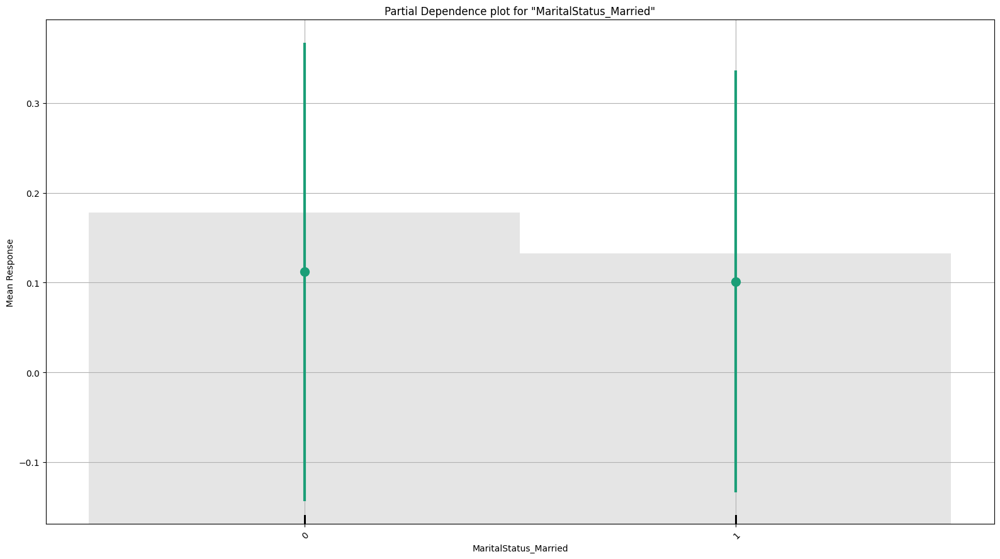

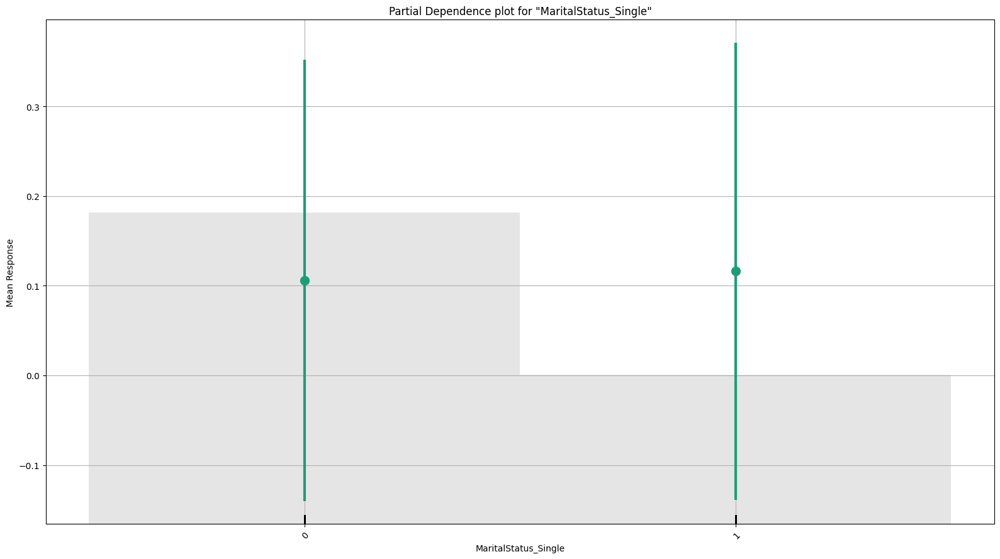

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_AllModels_1_AutoML_1_20250326_194124

,0,1,Error,Rate
0,373.0,11.0,0.0286,(11.0/384.0)
1,25.0,32.0,0.4386,(25.0/57.0)
Total,398.0,43.0,0.0816,(36.0/441.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

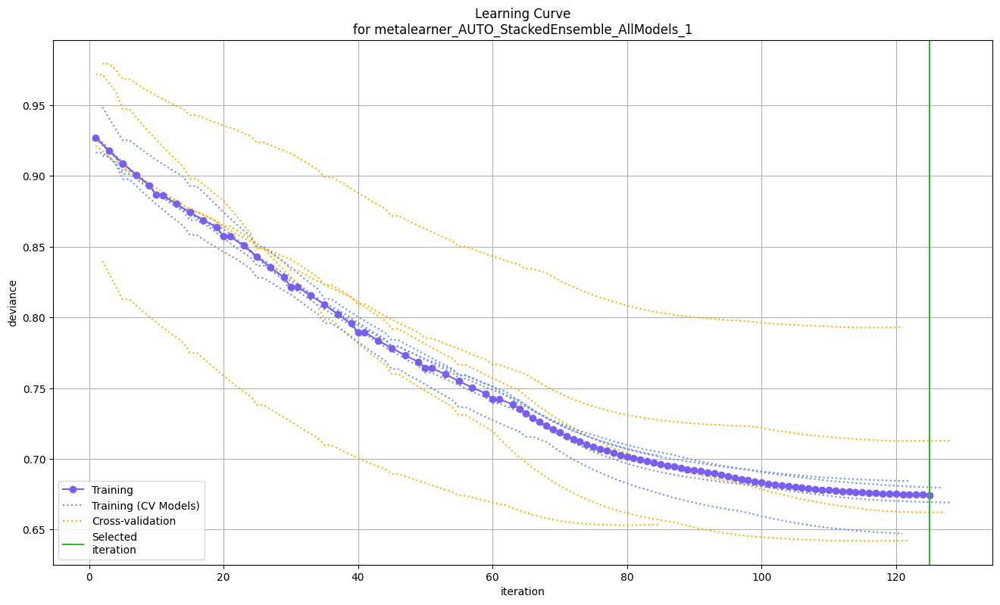

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

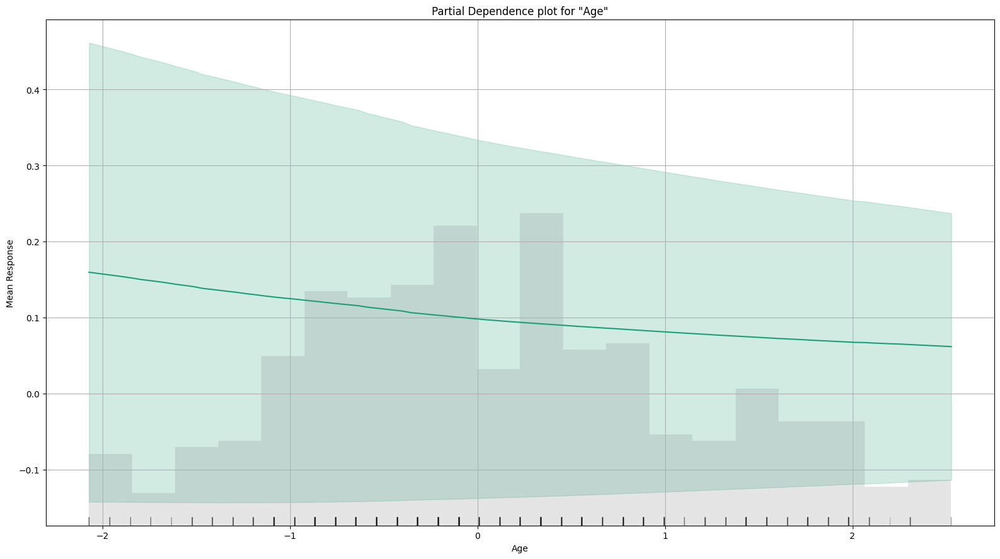

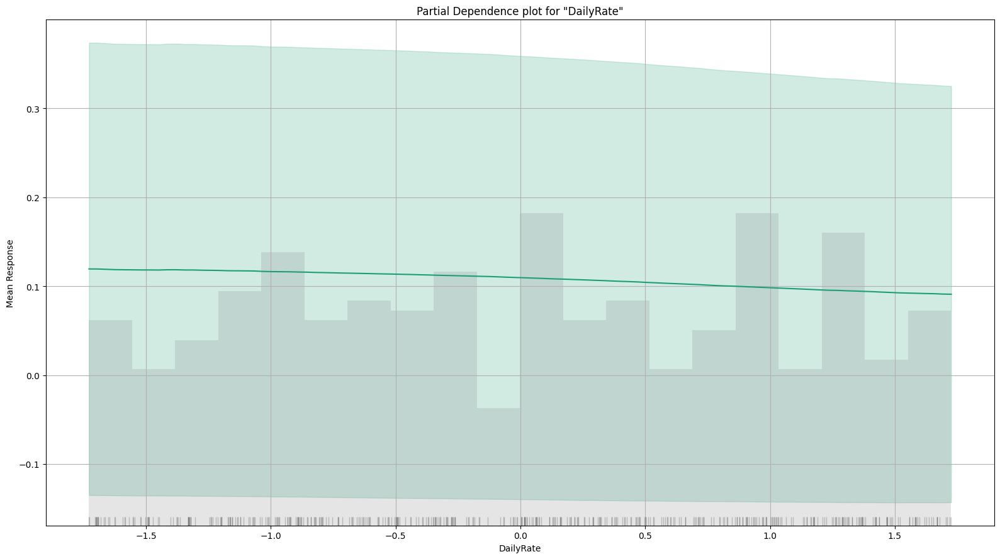

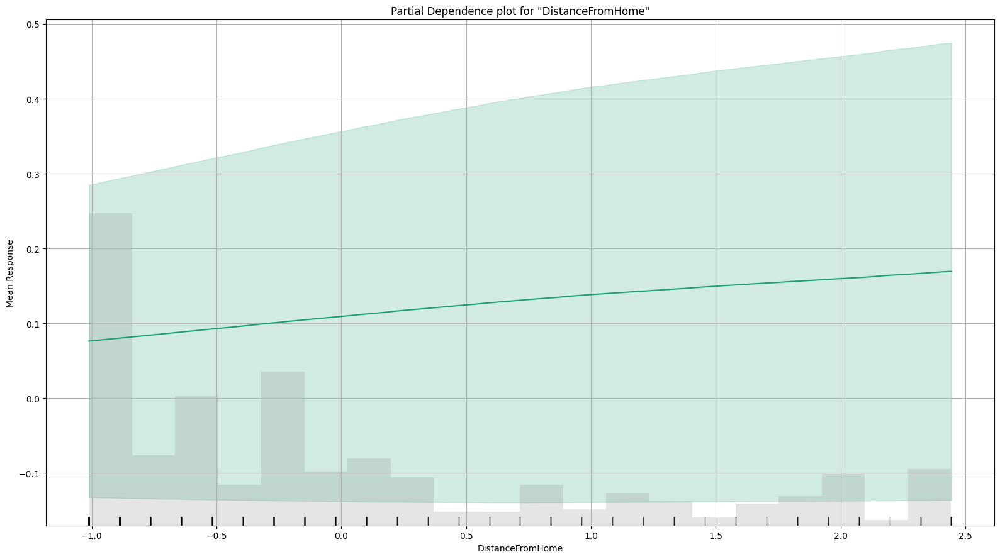

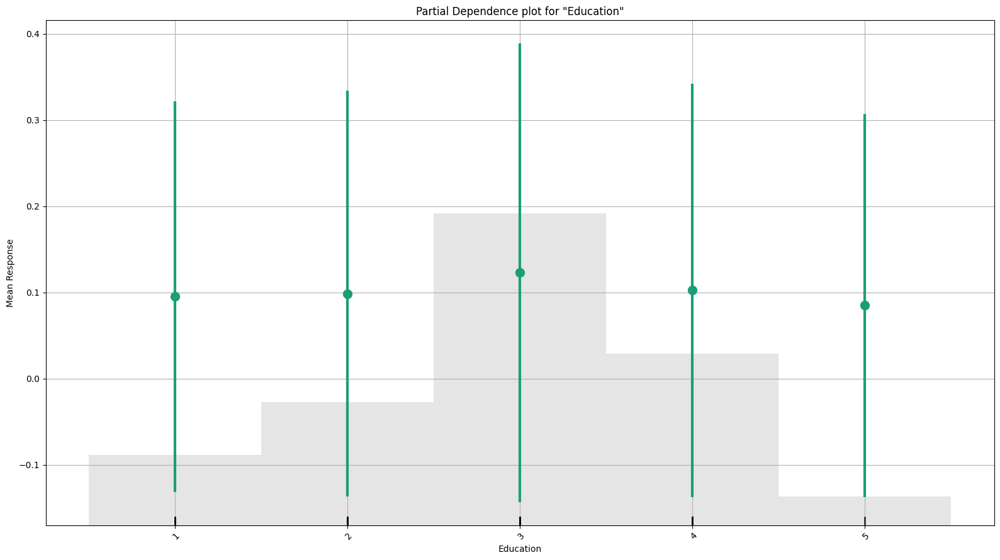

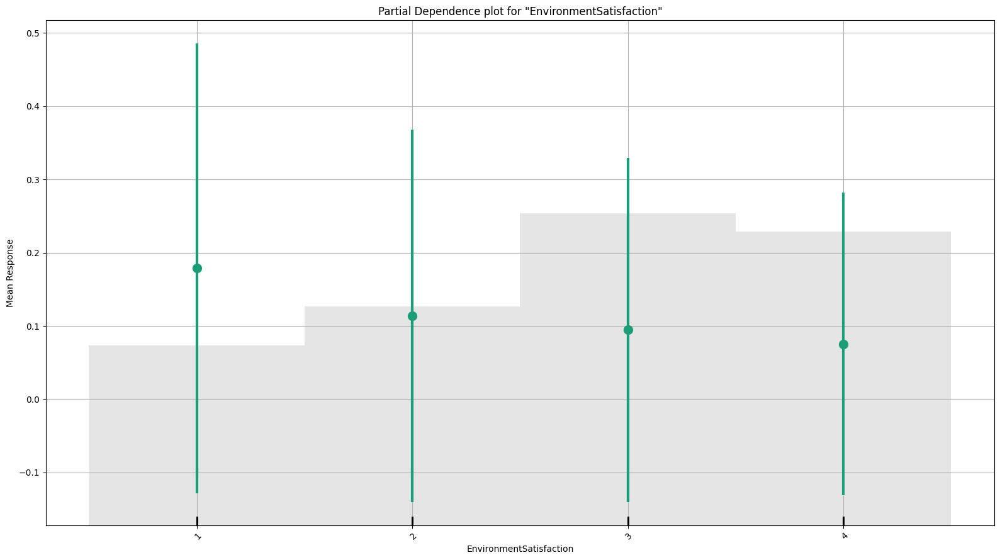

...

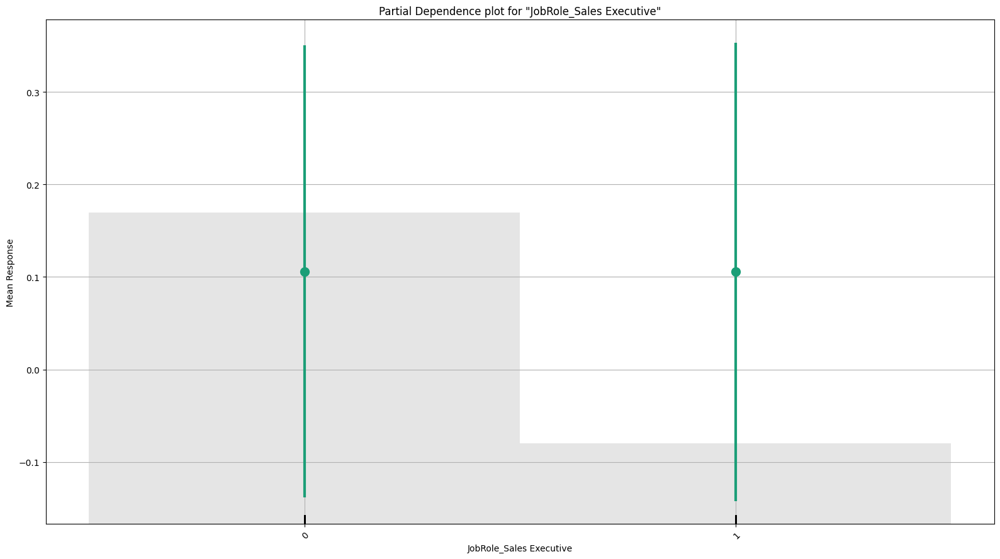

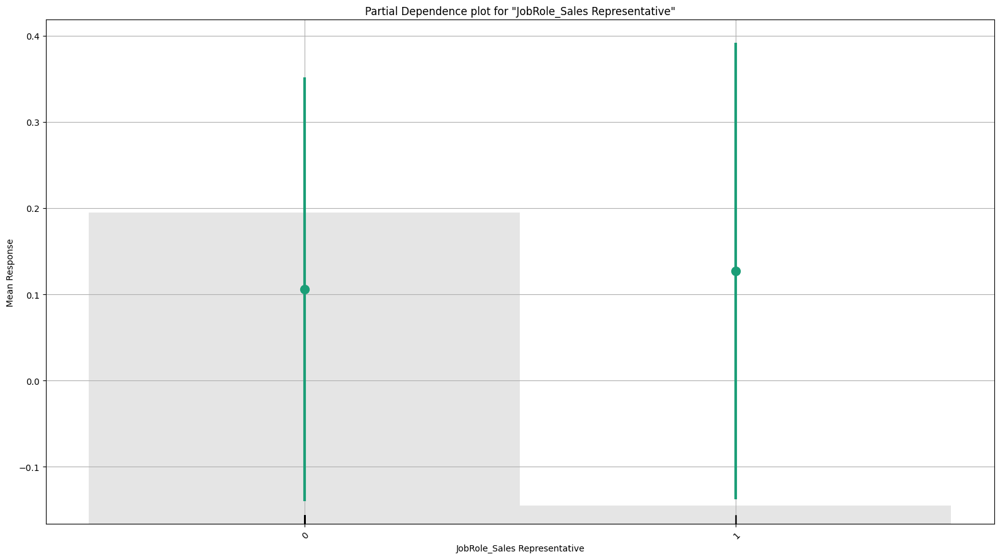

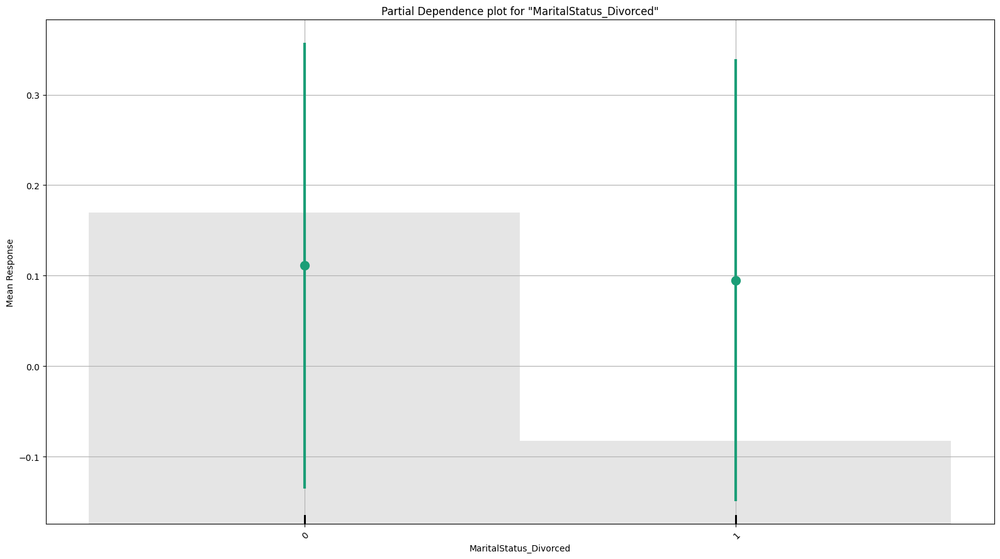

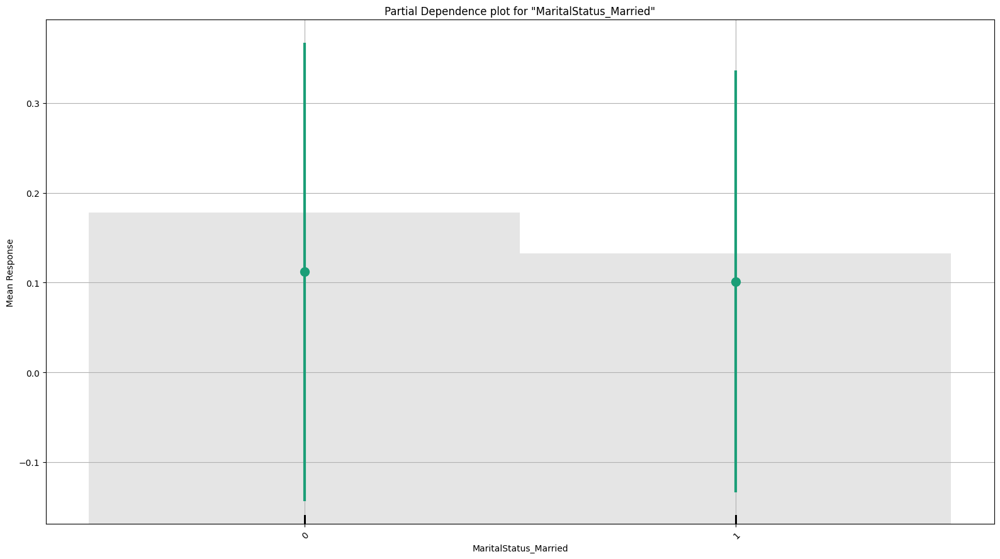

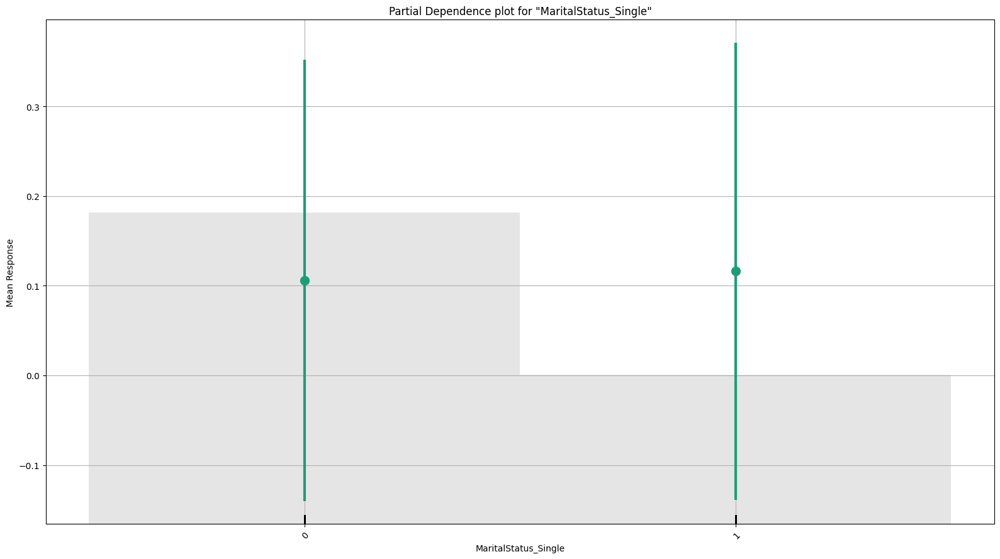

In [14]:
# Display test performance
cv_best_model.explain(test)

# Test Performance of other Models

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
GLM_1_AutoML_1_20250326_194124,0.90175,0.240586,0.745677,0.166393,0.257275,0.0661907,476,0.012114,GLM
StackedEnsemble_BestOfFamily_1_AutoML_1_20250326_194124,0.887838,0.23833,0.719084,0.214775,0.256081,0.0655775,2086,0.022201,StackedEnsemble
DeepLearning_1_AutoML_1_20250326_194124,0.881145,0.244994,0.686841,0.195312,0.259936,0.0675669,405,0.012687,DeepLearning
GBM_1_AutoML_1_20250326_194124,0.880711,0.28109,0.63274,0.250206,0.282159,0.079614,621,0.011254,GBM
GBM_grid_1_AutoML_1_20250326_194124_model_6,0.878746,0.290557,0.652074,0.227453,0.286926,0.0823264,301,0.07784,GBM
GBM_grid_1_AutoML_1_20250326_194124_model_11,0.875845,0.273532,0.638005,0.287212,0.277662,0.0770964,347,0.016129,GBM
GBM_grid_1_AutoML_1_20250326_194124_model_7,0.873812,0.284871,0.587734,0.220395,0.285073,0.0812668,301,0.012337,GBM
StackedEnsemble_AllModels_1_AutoML_1_20250326_194124,0.87283,0.318118,0.65879,0.233621,0.271169,0.0735324,4740,0.095998,StackedEnsemble
DeepLearning_grid_3_AutoML_1_20250326_194124_model_9,0.871025,1.30521,0.633567,0.213816,0.287414,0.0826066,7051,0.029985,DeepLearning
GBM_grid_1_AutoML_1_20250326_194124_model_14,0.867484,0.290677,0.607668,0.239515,0.287268,0.0825231,318,0.011493,GBM


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_AllModels_1_AutoML_1_20250326_194124

,0,1,Error,Rate
0,373.0,11.0,0.0286,(11.0/384.0)
1,25.0,32.0,0.4386,(25.0/57.0)
Total,398.0,43.0,0.0816,(36.0/441.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

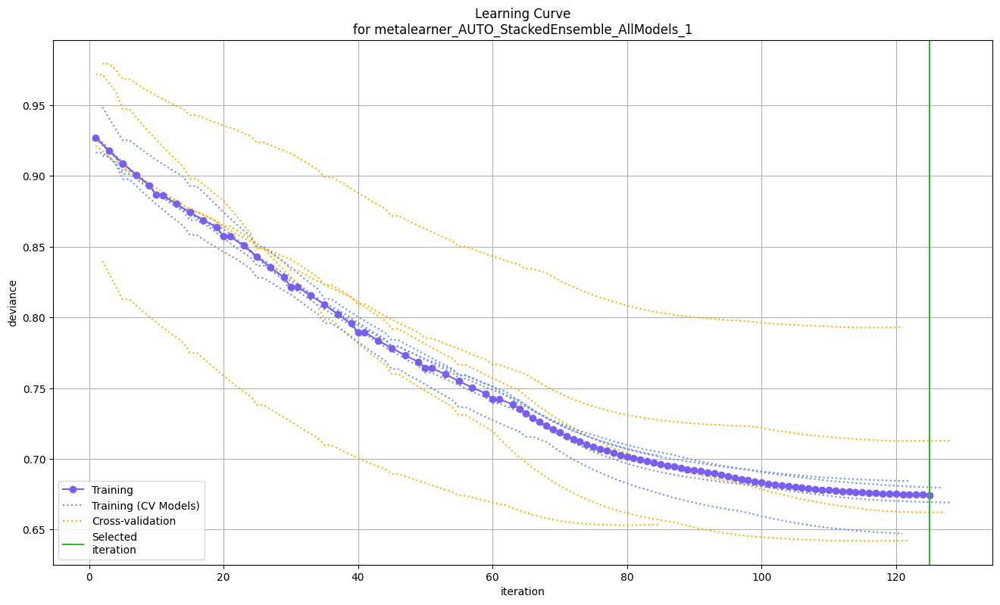

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

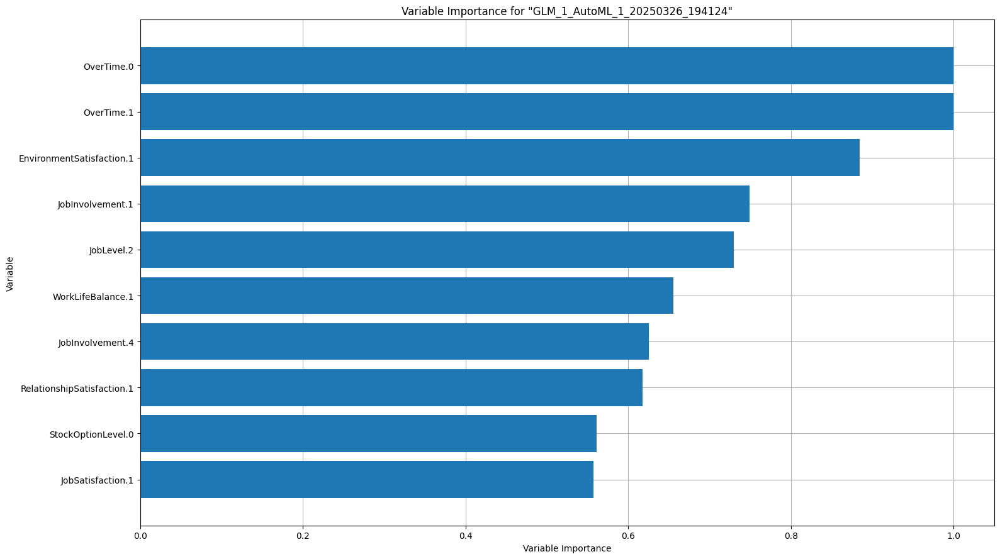

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

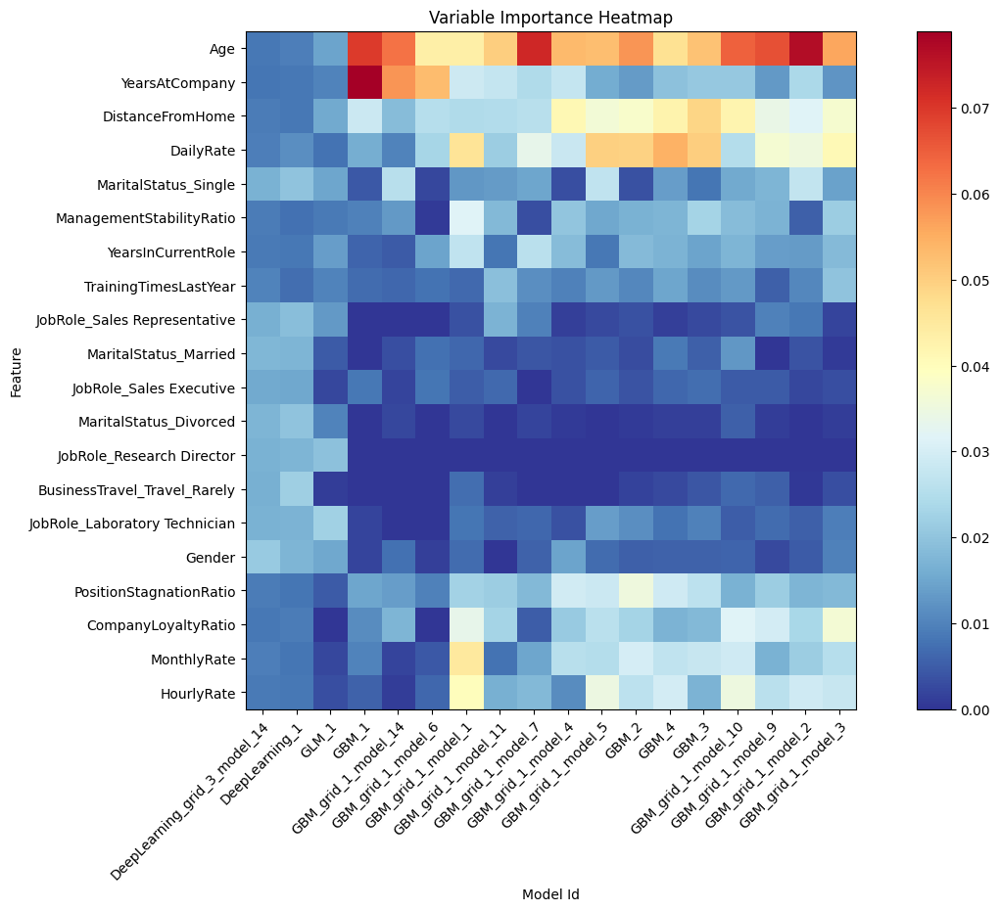

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

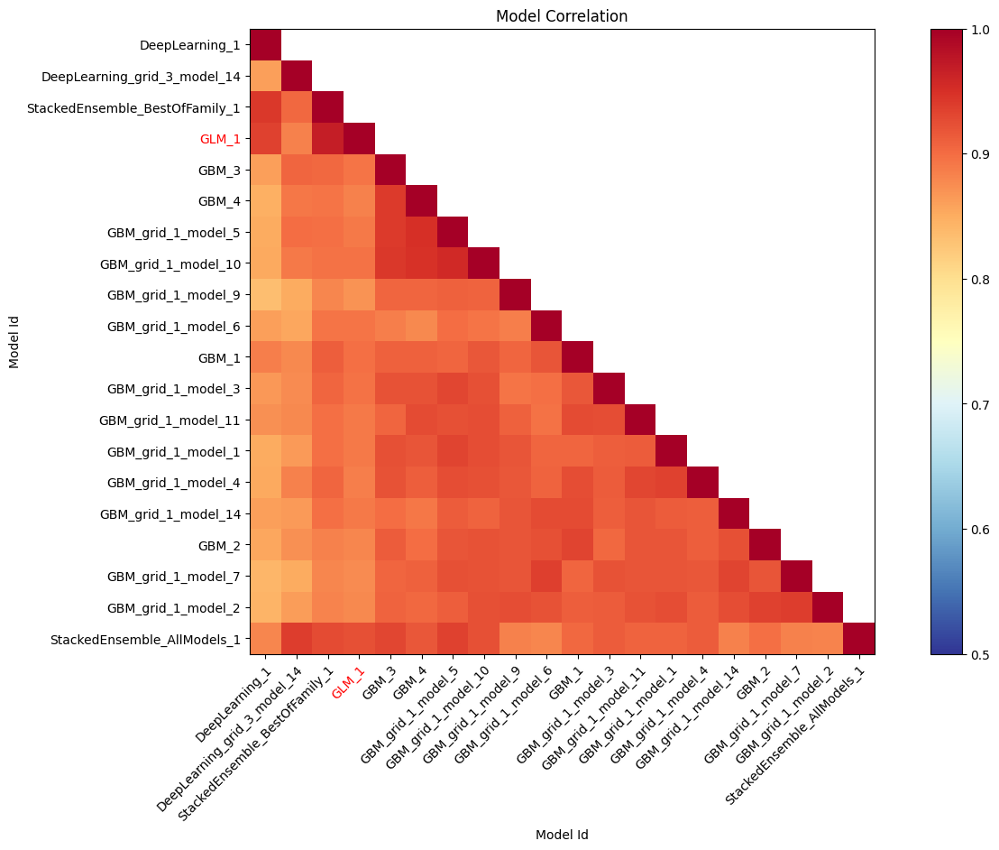

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

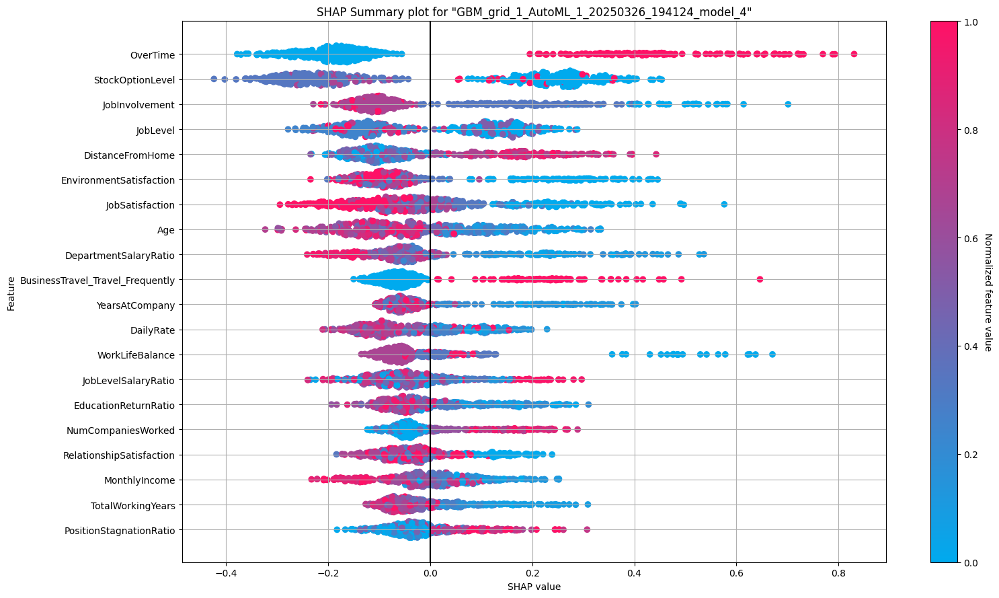

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

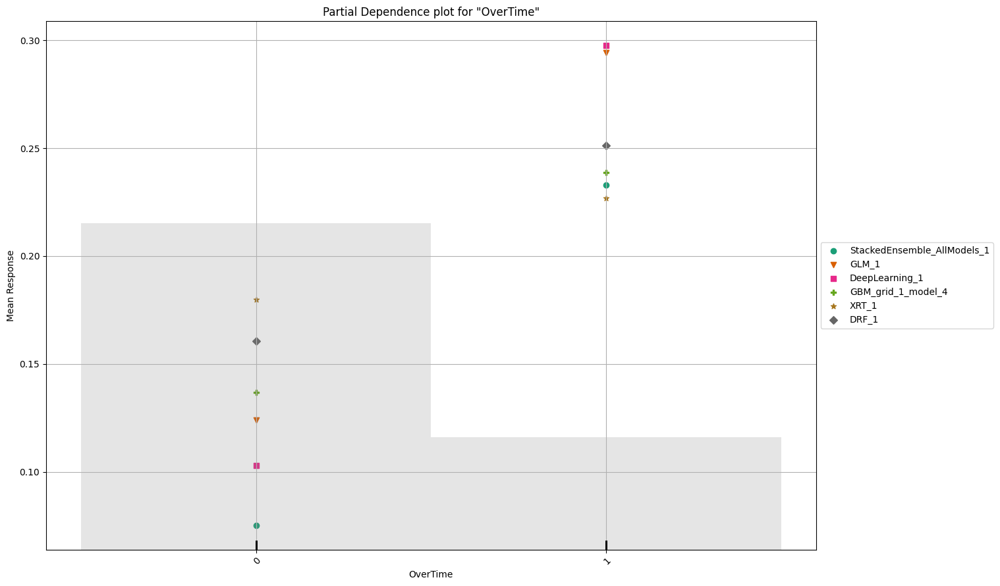

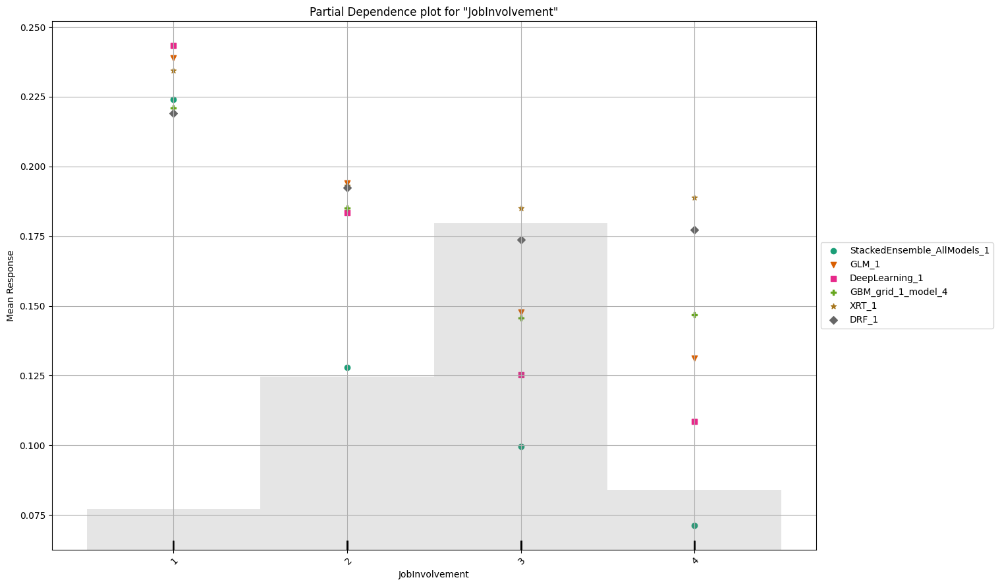

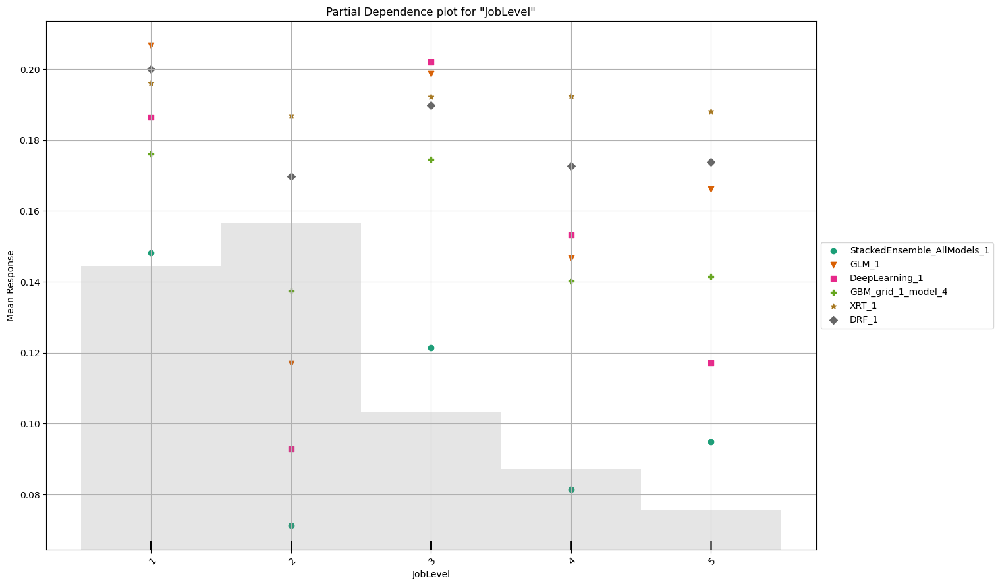

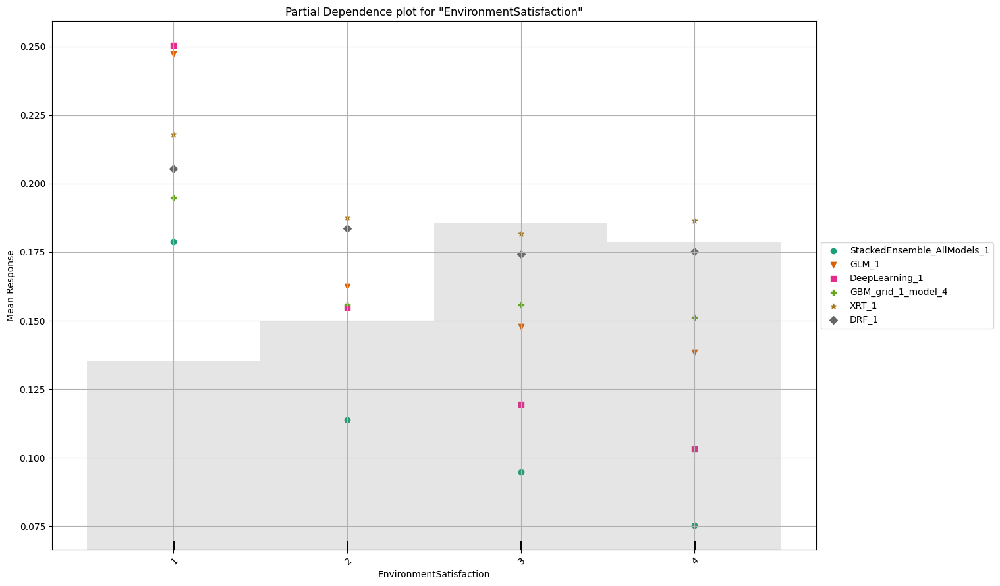

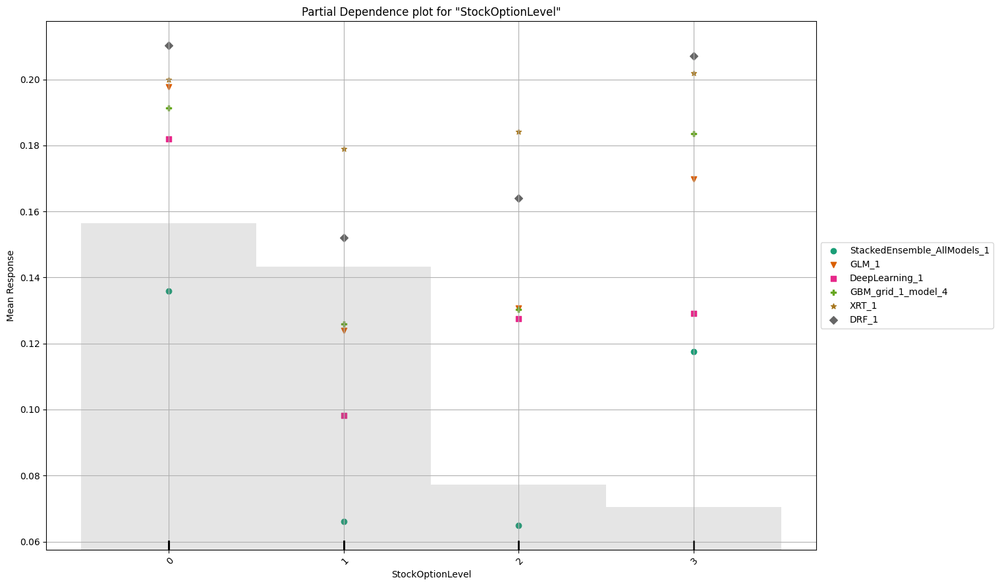

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
GLM_1_AutoML_1_20250326_194124,0.90175,0.240586,0.745677,0.166393,0.257275,0.0661907,476,0.012114,GLM
StackedEnsemble_BestOfFamily_1_AutoML_1_20250326_194124,0.887838,0.23833,0.719084,0.214775,0.256081,0.0655775,2086,0.022201,StackedEnsemble
DeepLearning_1_AutoML_1_20250326_194124,0.881145,0.244994,0.686841,0.195312,0.259936,0.0675669,405,0.012687,DeepLearning
GBM_1_AutoML_1_20250326_194124,0.880711,0.28109,0.63274,0.250206,0.282159,0.079614,621,0.011254,GBM
GBM_grid_1_AutoML_1_20250326_194124_model_6,0.878746,0.290557,0.652074,0.227453,0.286926,0.0823264,301,0.07784,GBM
GBM_grid_1_AutoML_1_20250326_194124_model_11,0.875845,0.273532,0.638005,0.287212,0.277662,0.0770964,347,0.016129,GBM
GBM_grid_1_AutoML_1_20250326_194124_model_7,0.873812,0.284871,0.587734,0.220395,0.285073,0.0812668,301,0.012337,GBM
StackedEnsemble_AllModels_1_AutoML_1_20250326_194124,0.87283,0.318118,0.65879,0.233621,0.271169,0.0735324,4740,0.095998,StackedEnsemble
DeepLearning_grid_3_AutoML_1_20250326_194124_model_9,0.871025,1.30521,0.633567,0.213816,0.287414,0.0826066,7051,0.029985,DeepLearning
GBM_grid_1_AutoML_1_20250326_194124_model_14,0.867484,0.290677,0.607668,0.239515,0.287268,0.0825231,318,0.011493,GBM


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_AllModels_1_AutoML_1_20250326_194124

,0,1,Error,Rate
0,373.0,11.0,0.0286,(11.0/384.0)
1,25.0,32.0,0.4386,(25.0/57.0)
Total,398.0,43.0,0.0816,(36.0/441.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

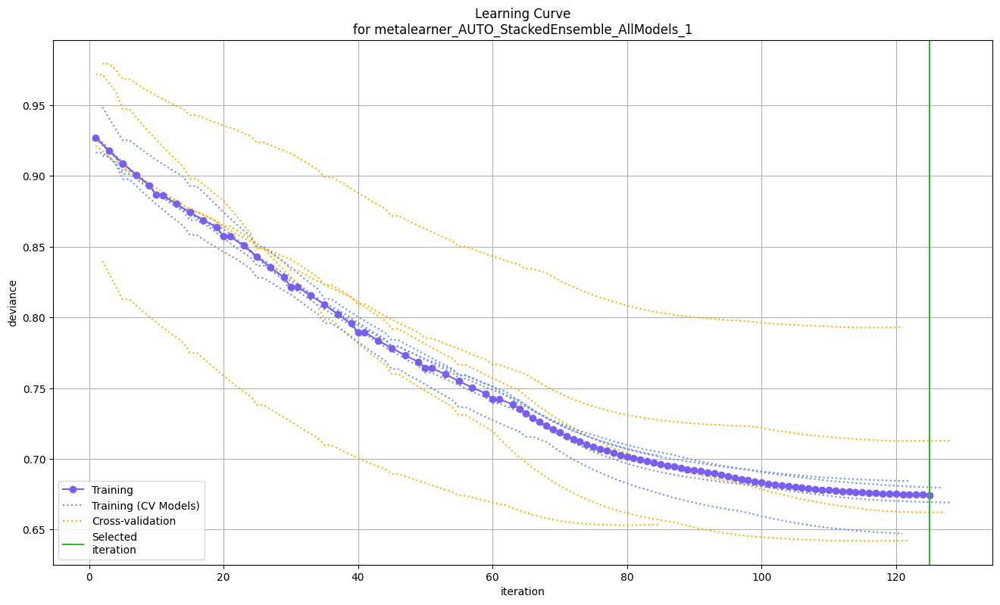

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

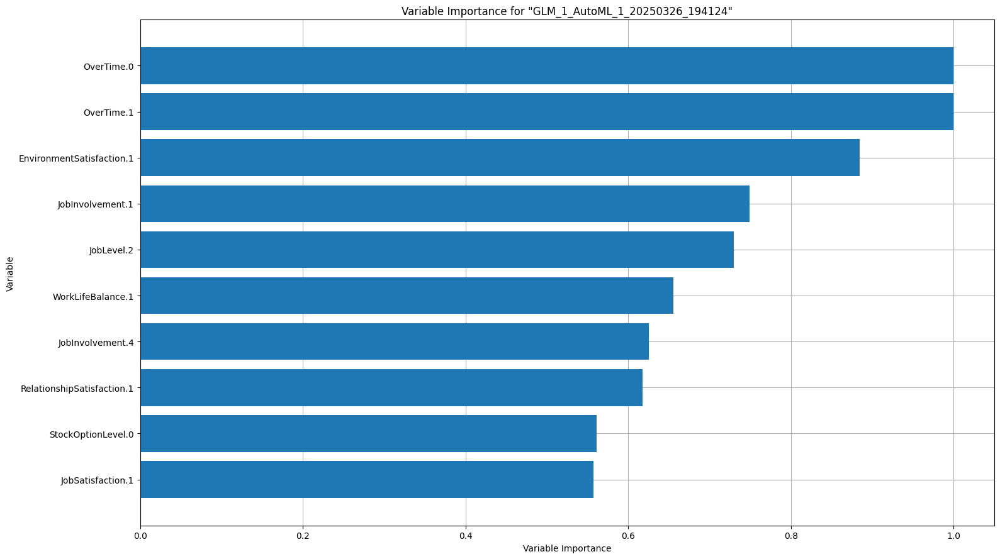

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

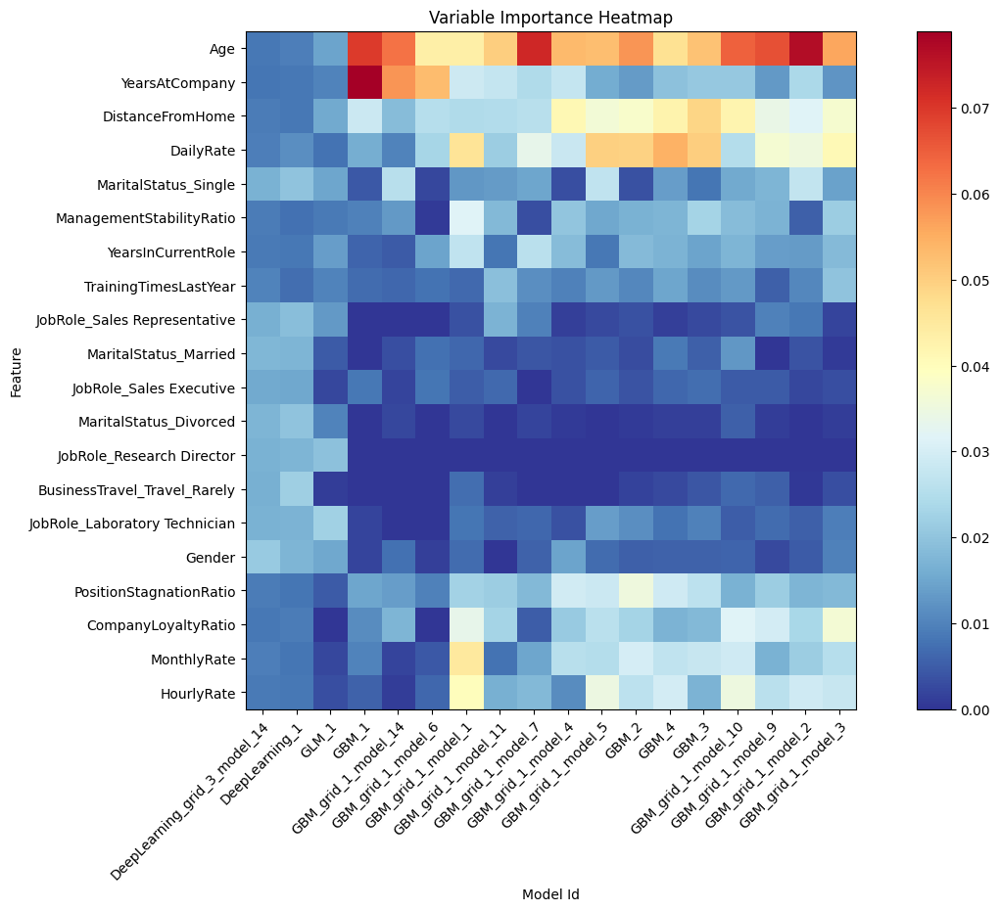

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

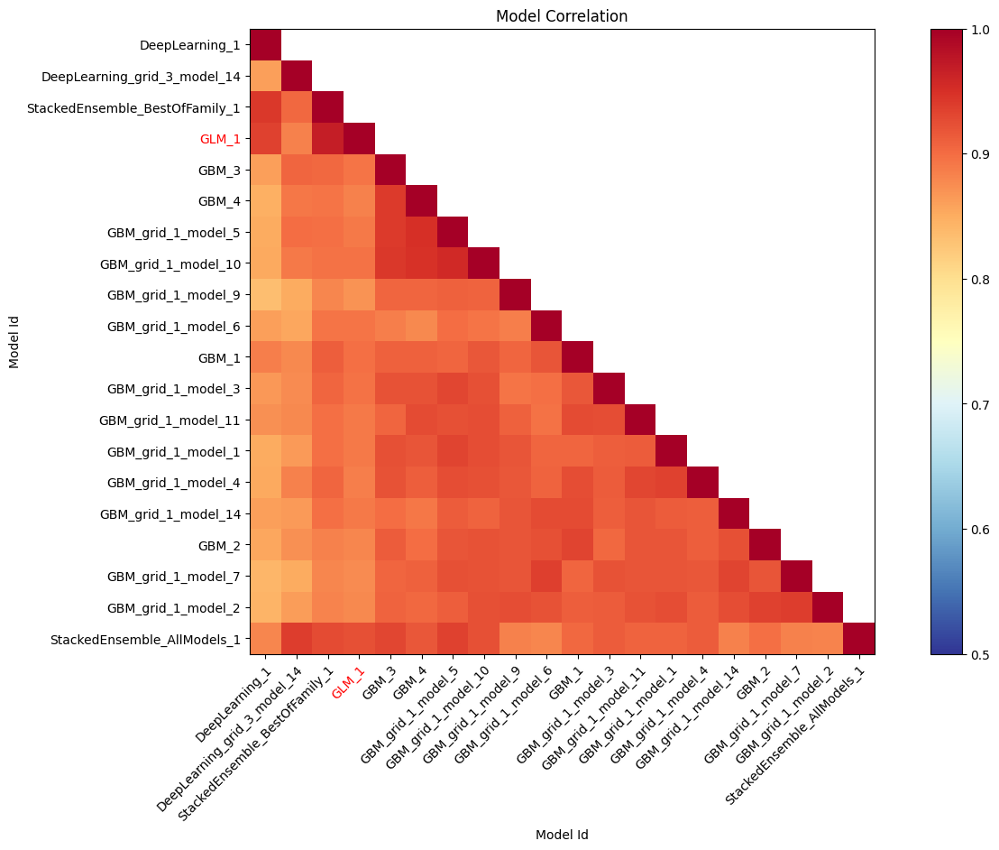

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

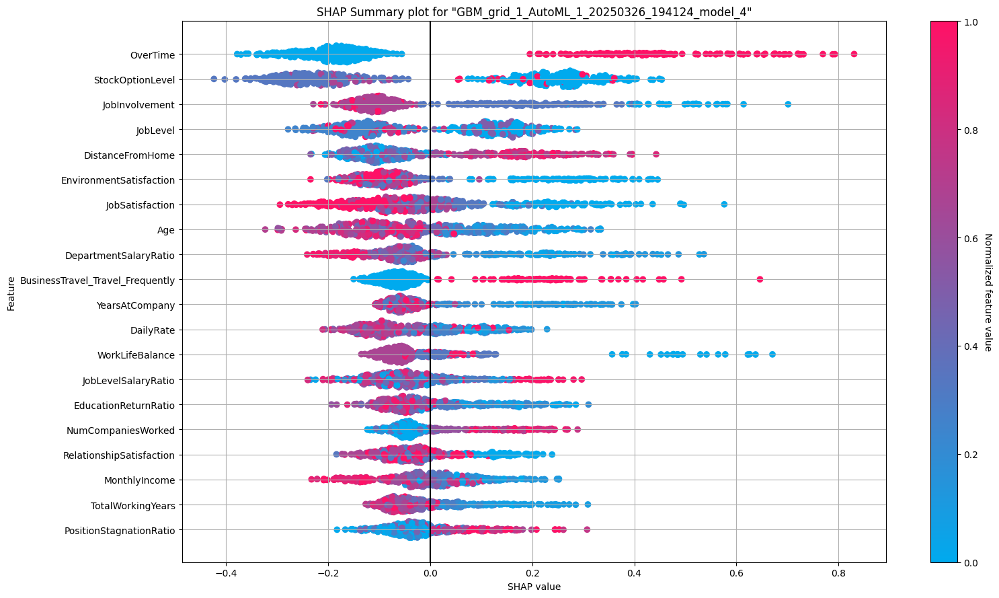

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

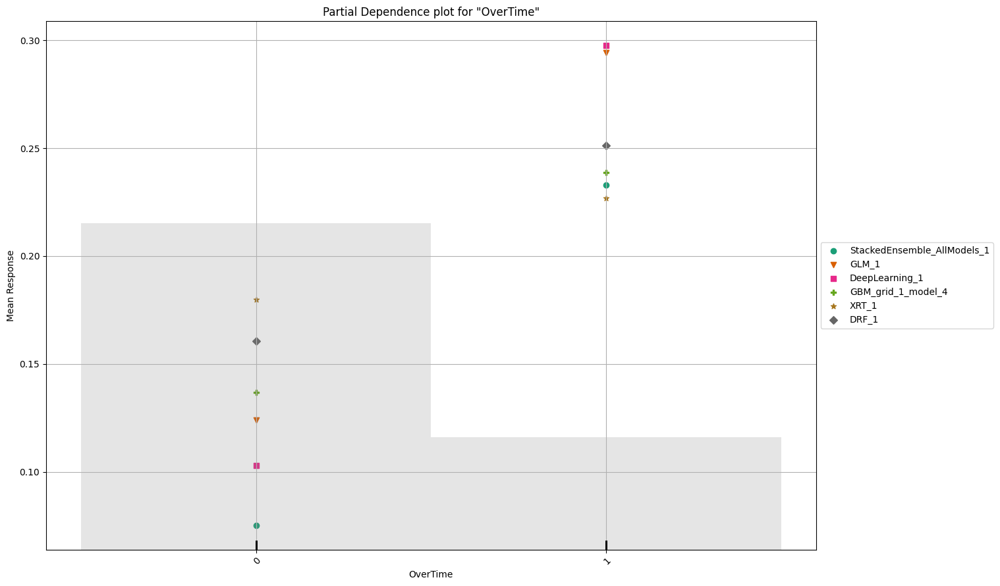

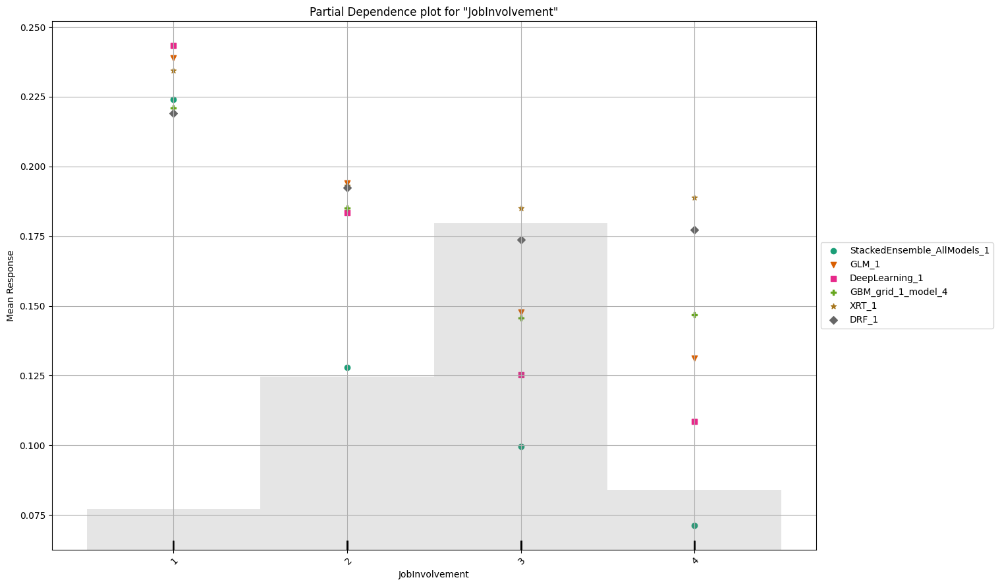

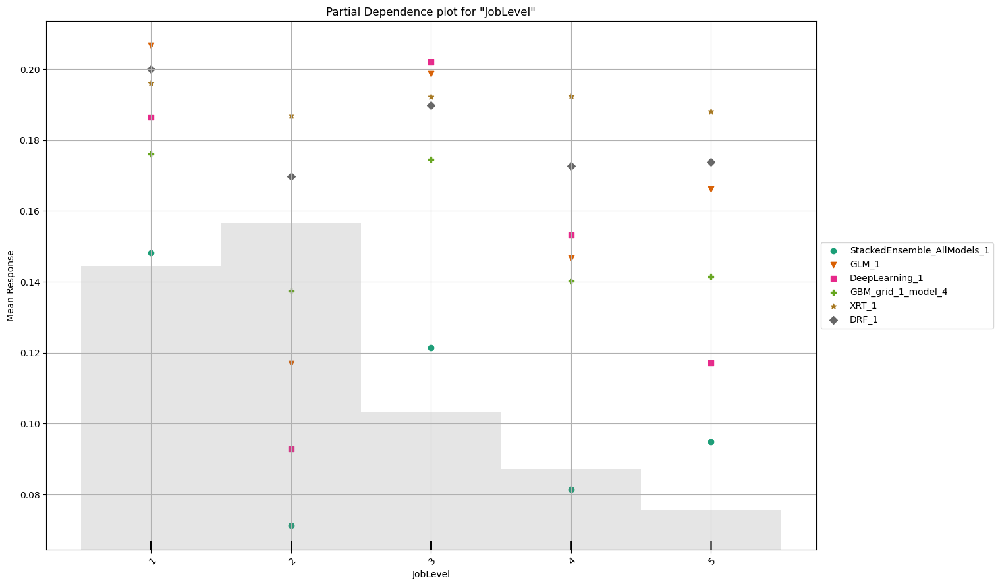

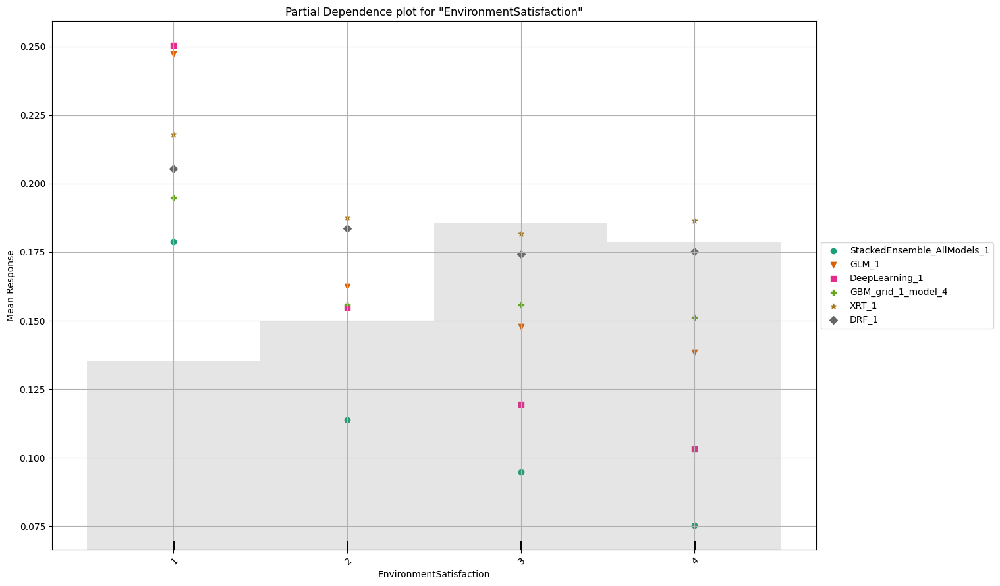

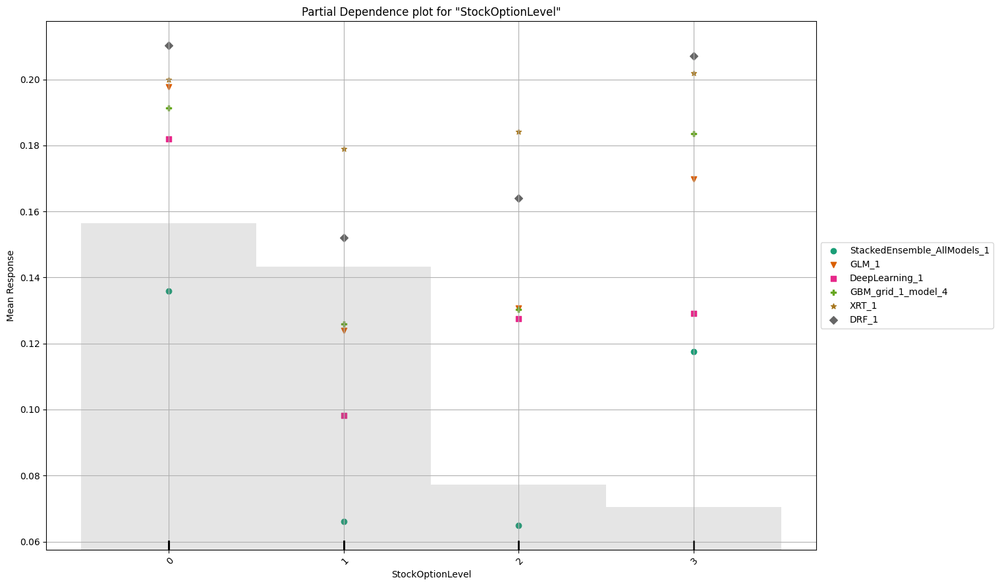

In [15]:
# Leaderboard based on Test results & comparison of models
aml.explain(test)

In [16]:
# Leaderboard for test performance
test_lb = h2o.make_leaderboard(aml, test, sort_metric="logloss")
test_lb.head(rows=test_lb.nrows)  # Print all rows instead of default (10 rows)

model_id,logloss,auc,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_1_AutoML_1_20250326_194124,0.23833,0.887838,0.719084,0.214775,0.256081,0.0655775
GLM_1_AutoML_1_20250326_194124,0.240586,0.90175,0.745677,0.166393,0.257275,0.0661907
DeepLearning_1_AutoML_1_20250326_194124,0.244994,0.881145,0.686841,0.195312,0.259936,0.0675669
GBM_3_AutoML_1_20250326_194124,0.267336,0.854007,0.612298,0.24534,0.275876,0.0761074
GBM_grid_1_AutoML_1_20250326_194124_model_11,0.273532,0.875845,0.638005,0.287212,0.277662,0.0770964
GBM_grid_1_AutoML_1_20250326_194124_model_9,0.273724,0.862459,0.61246,0.263843,0.27886,0.0777631
GBM_grid_1_AutoML_1_20250326_194124_model_10,0.273765,0.856611,0.589864,0.232388,0.281613,0.0793058
GBM_2_AutoML_1_20250326_194124,0.274299,0.863784,0.58701,0.207717,0.281327,0.0791449
GBM_1_AutoML_1_20250326_194124,0.28109,0.880711,0.63274,0.250206,0.282159,0.079614
GBM_grid_1_AutoML_1_20250326_194124_model_4,0.281298,0.848547,0.589445,0.208333,0.282512,0.0798129


In [17]:
# Getting best model for test
test_best_model_ID = test_lb[0, 0]
test_best_model = h2o.get_model(test_best_model_ID)

# Display Training and CV performance
test_best_model

key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/5
# GBM base models (used / total),1/1
# GLM base models (used / total),1/1
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),0/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_1_AutoML_1_20250326_194124

,0,1,Error,Rate
0,374.0,10.0,0.026,(10.0/384.0)
1,23.0,34.0,0.4035,(23.0/57.0)
Total,397.0,44.0,0.0748,(33.0/441.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

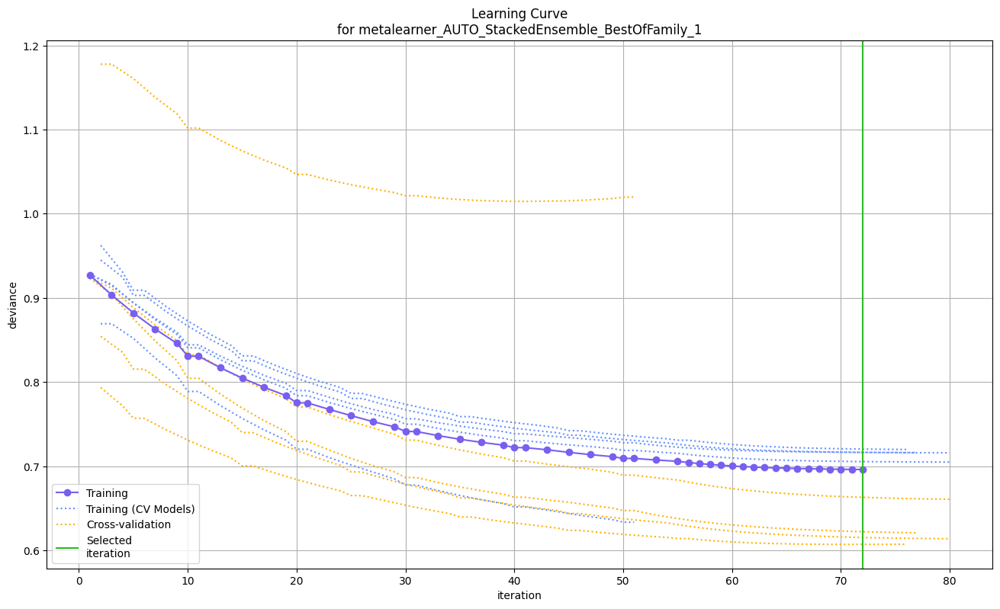

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

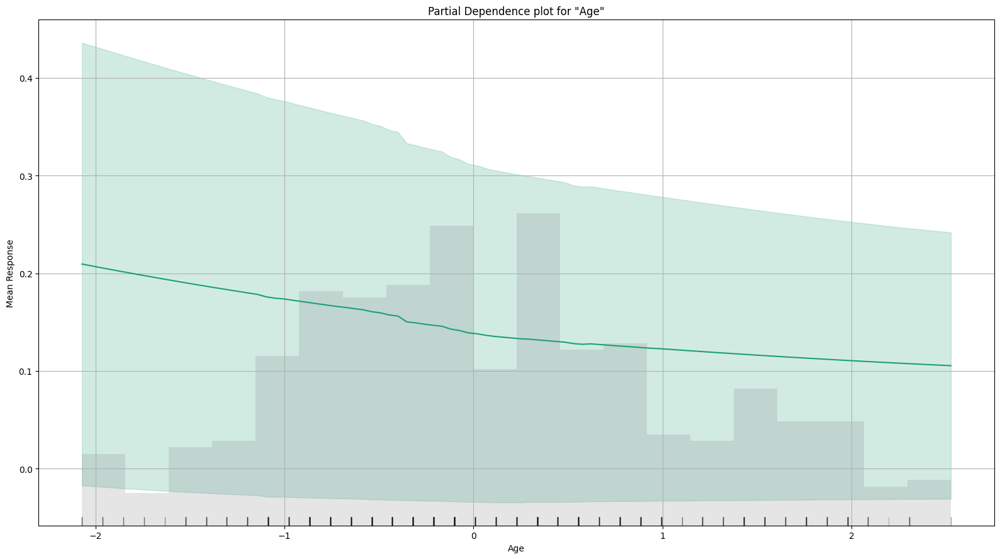

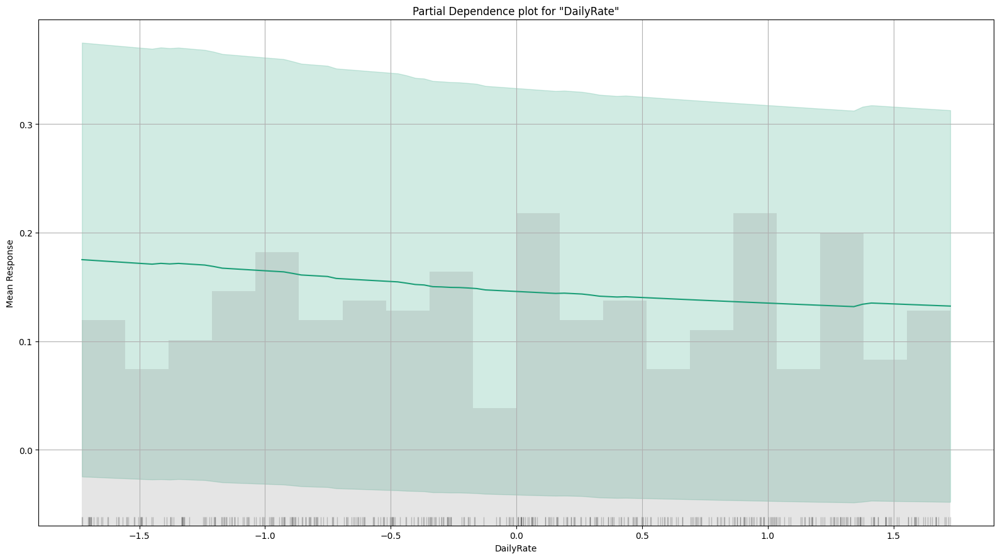

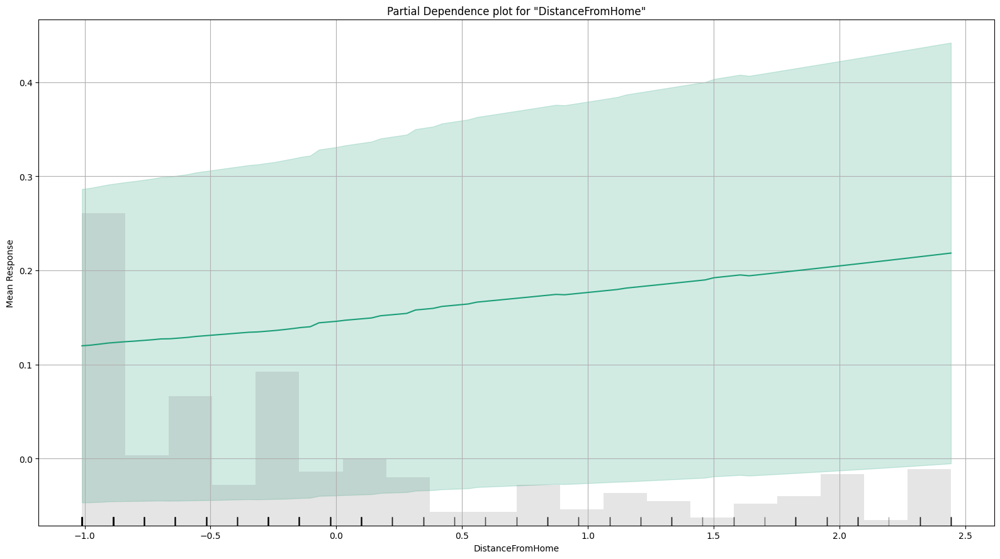

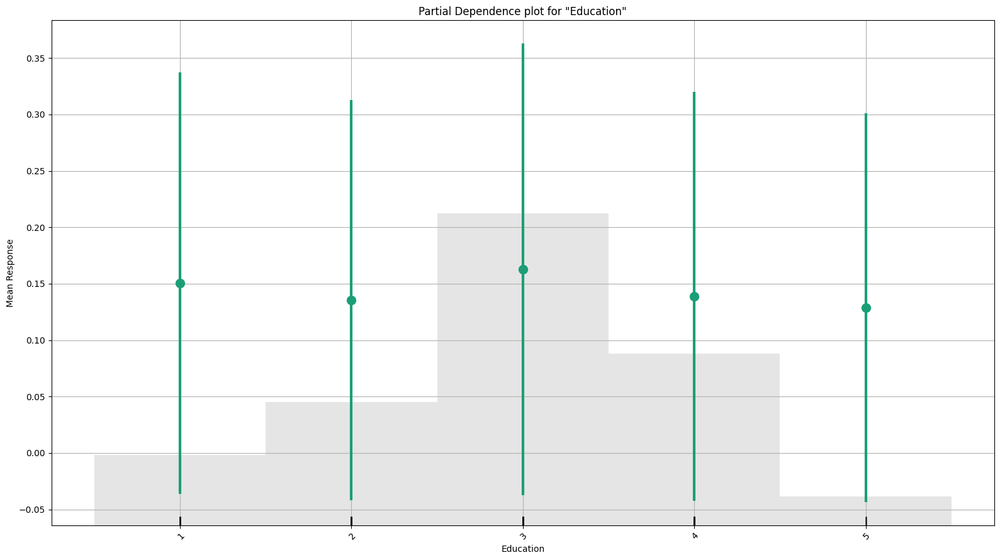

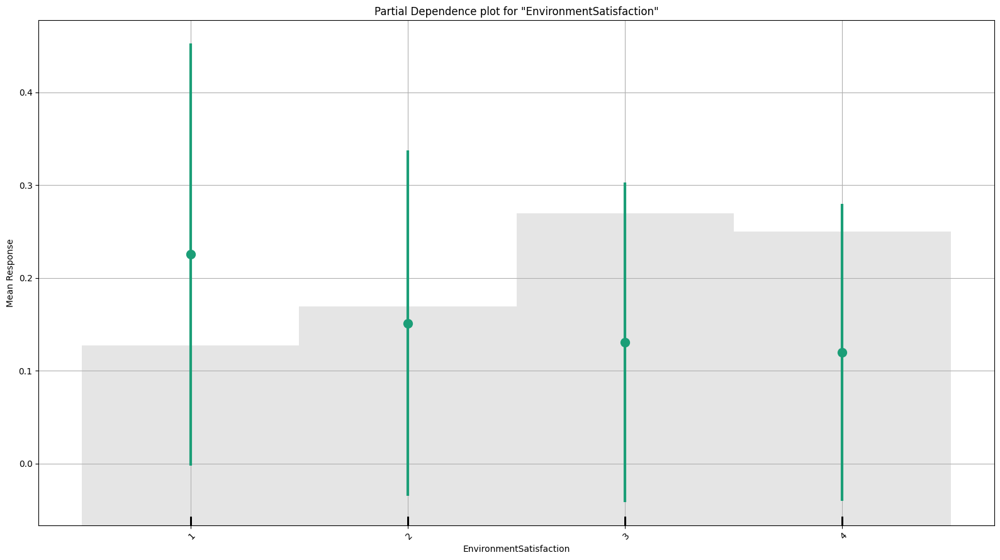

...

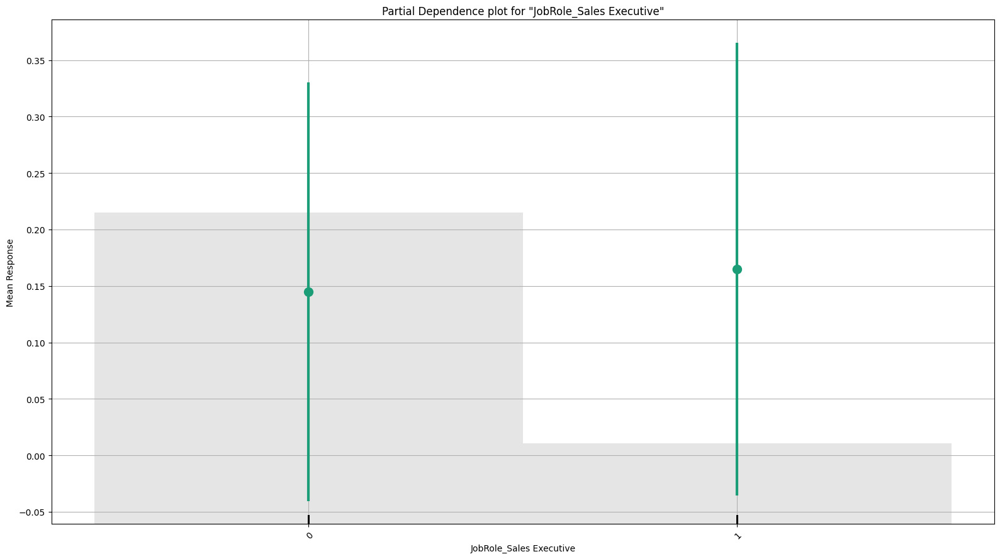

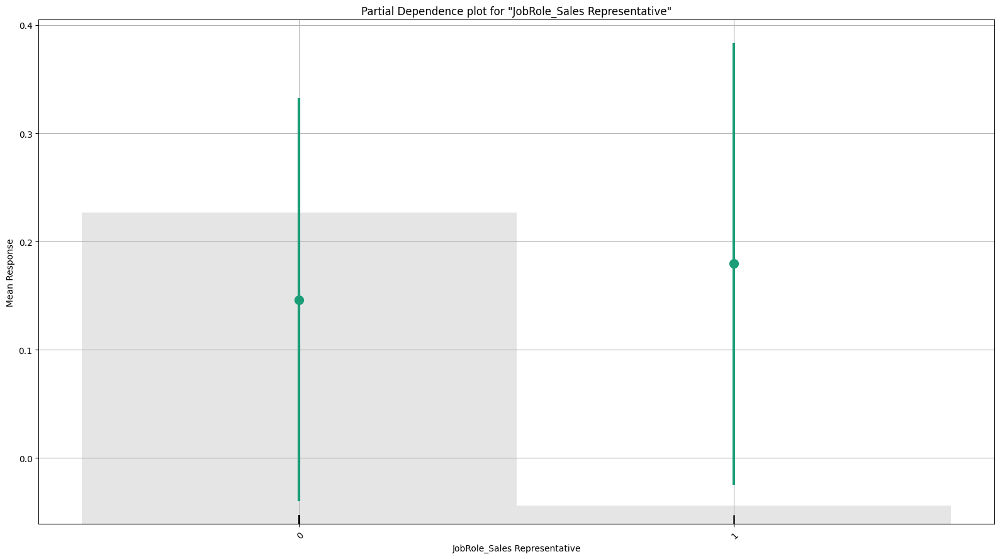

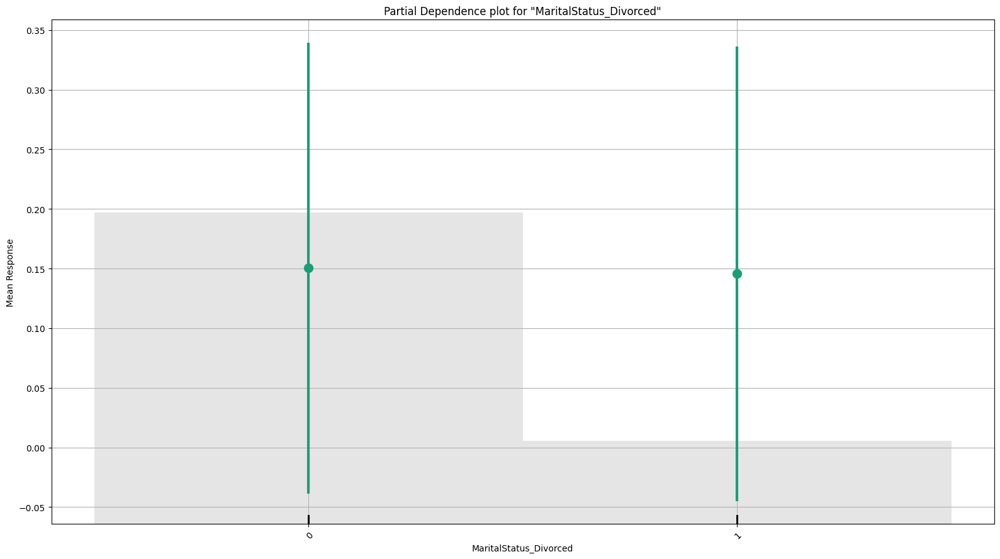

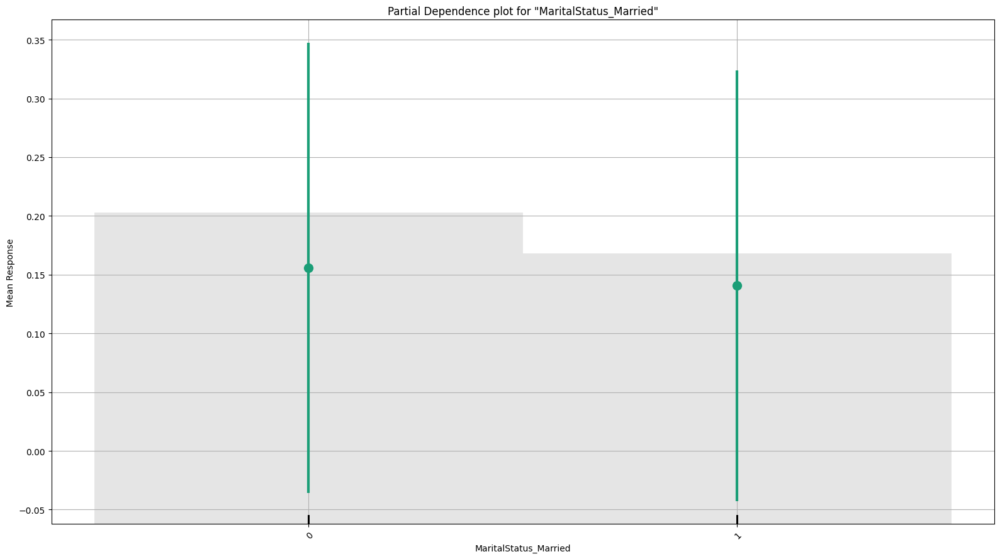

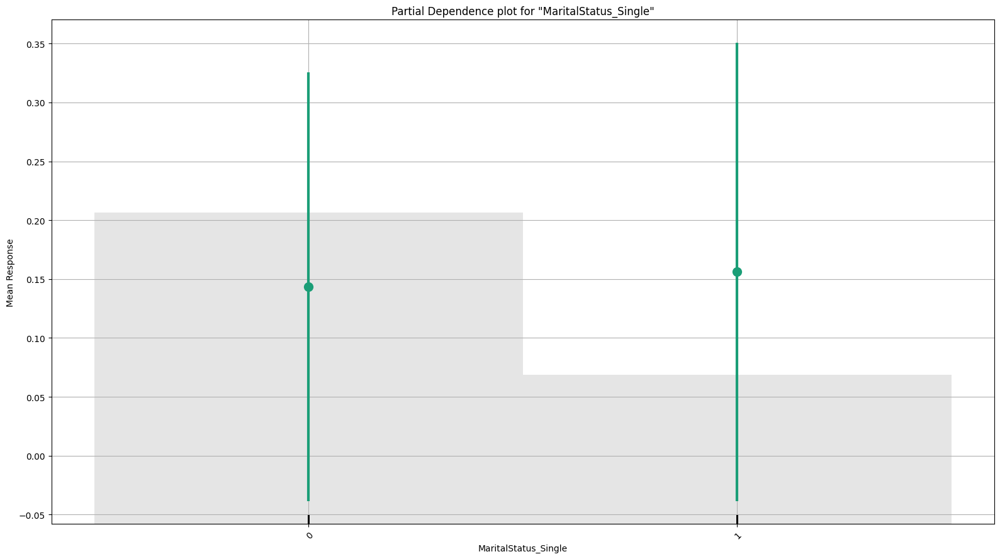

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_1_AutoML_1_20250326_194124

,0,1,Error,Rate
0,374.0,10.0,0.026,(10.0/384.0)
1,23.0,34.0,0.4035,(23.0/57.0)
Total,397.0,44.0,0.0748,(33.0/441.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

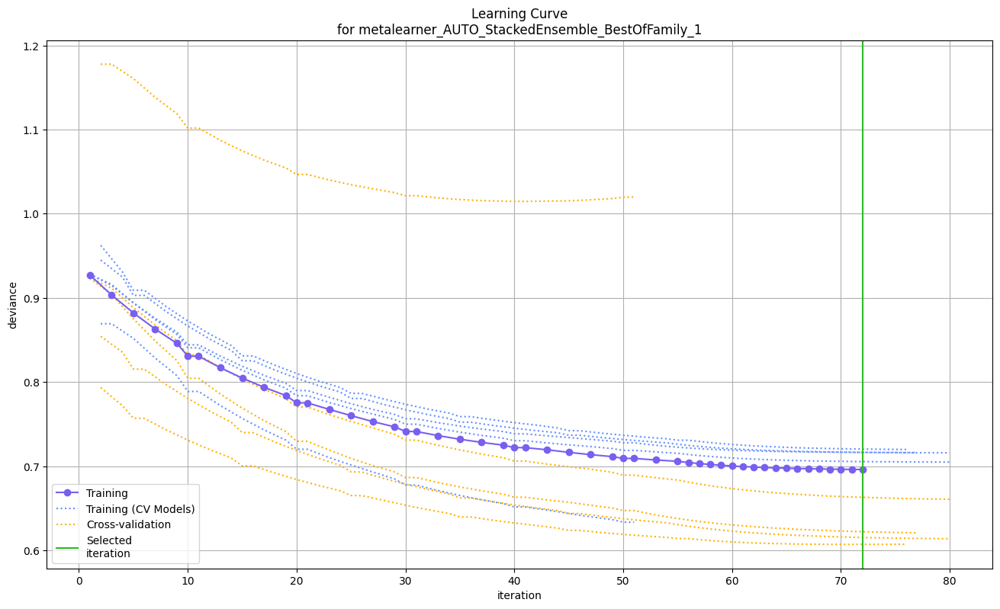

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

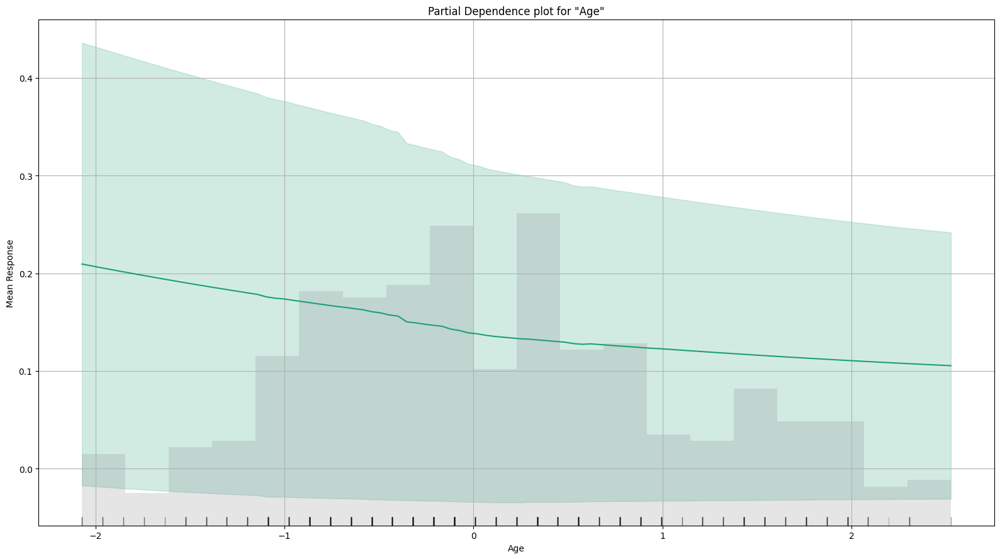

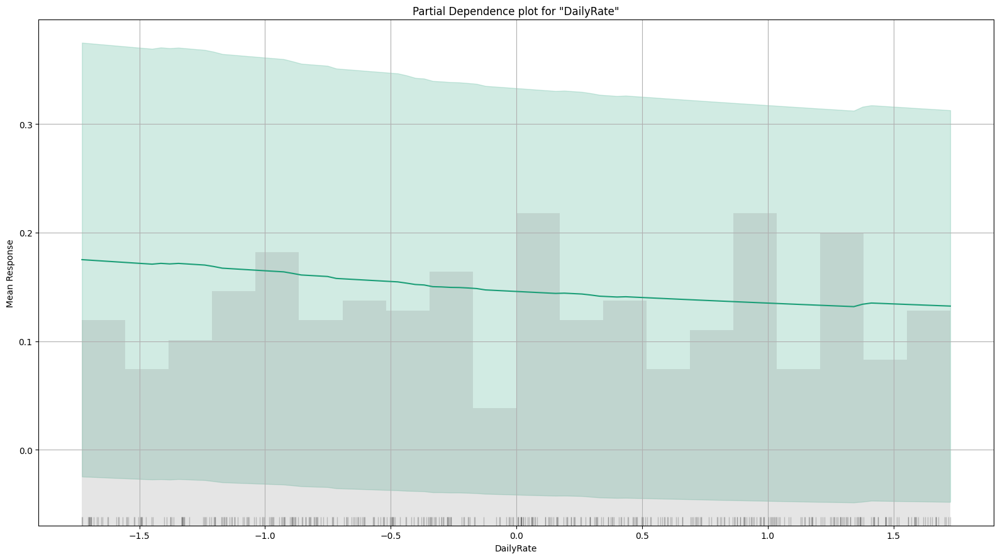

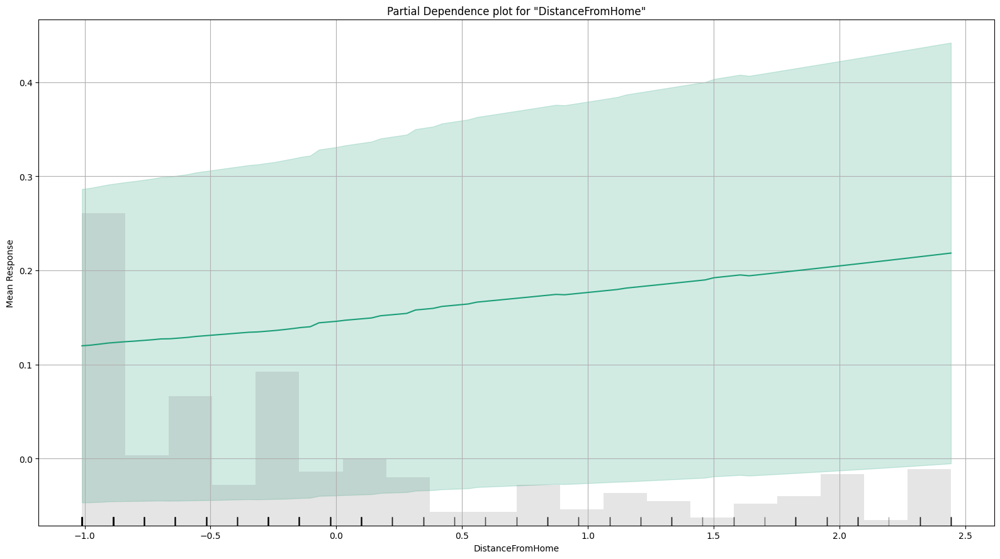

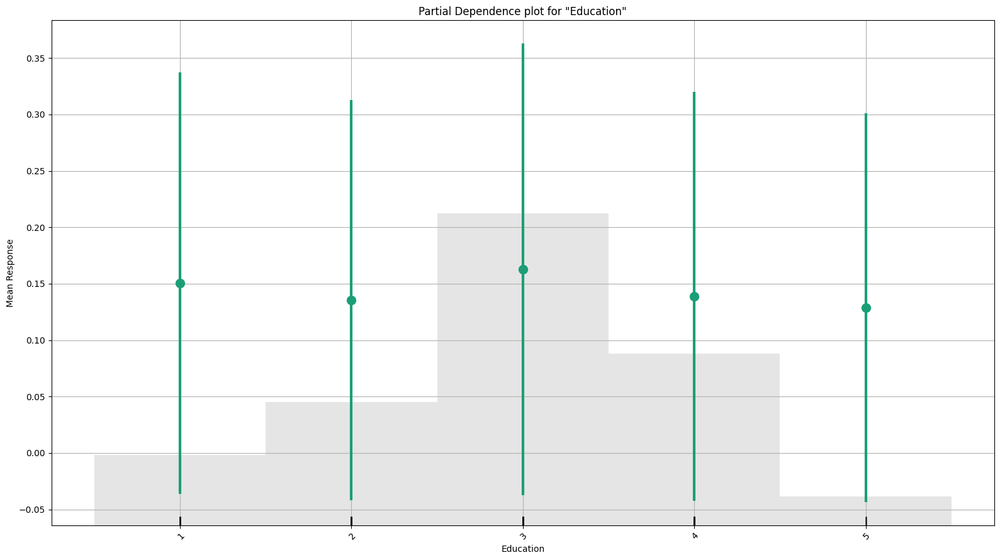

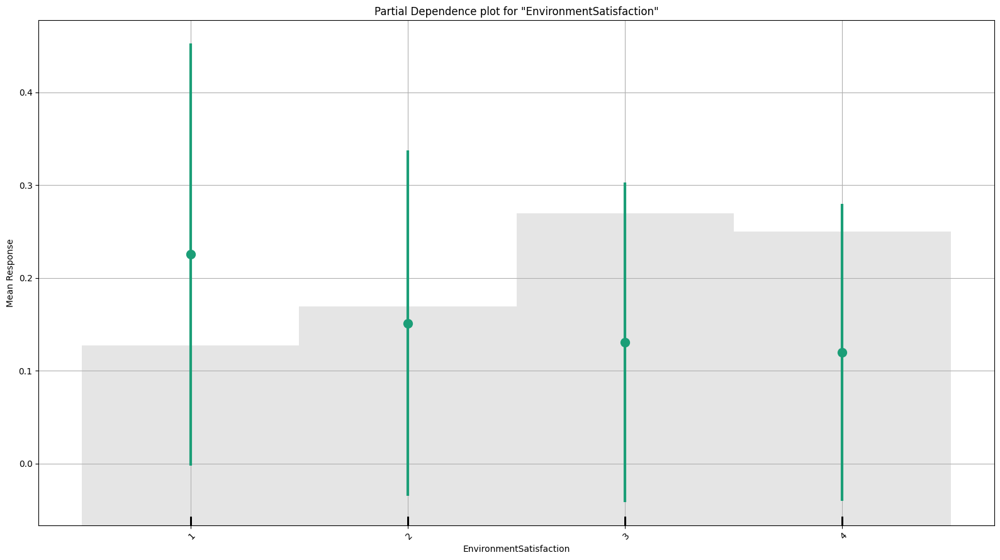

...

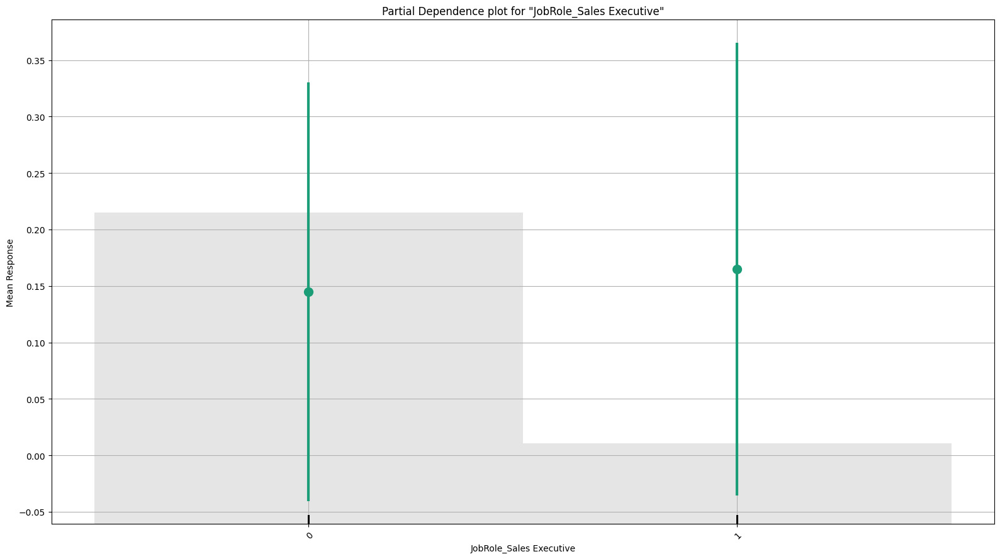

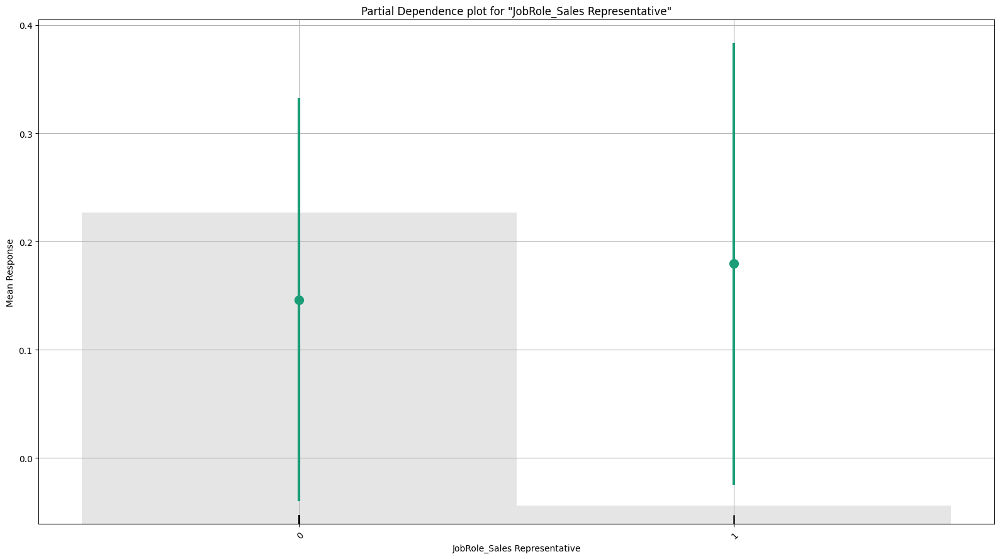

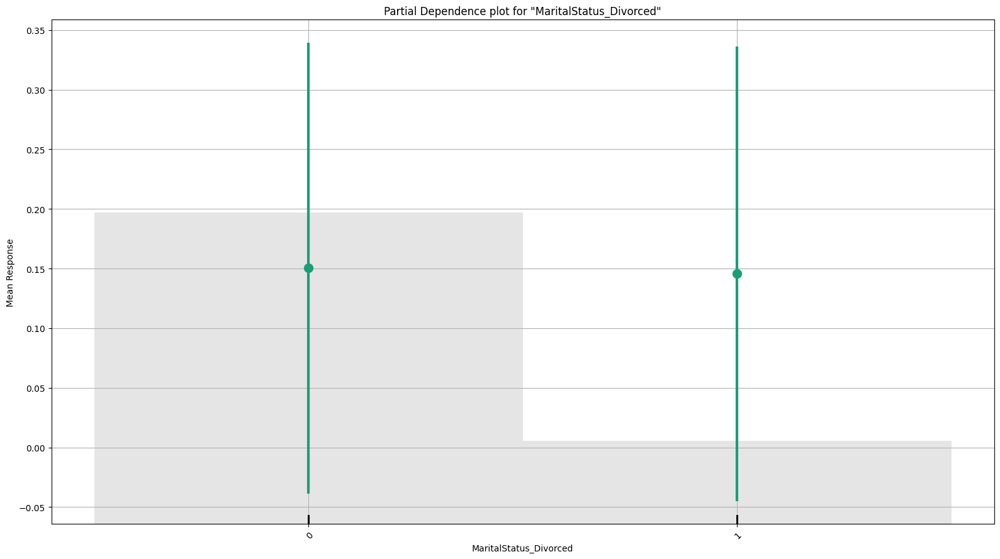

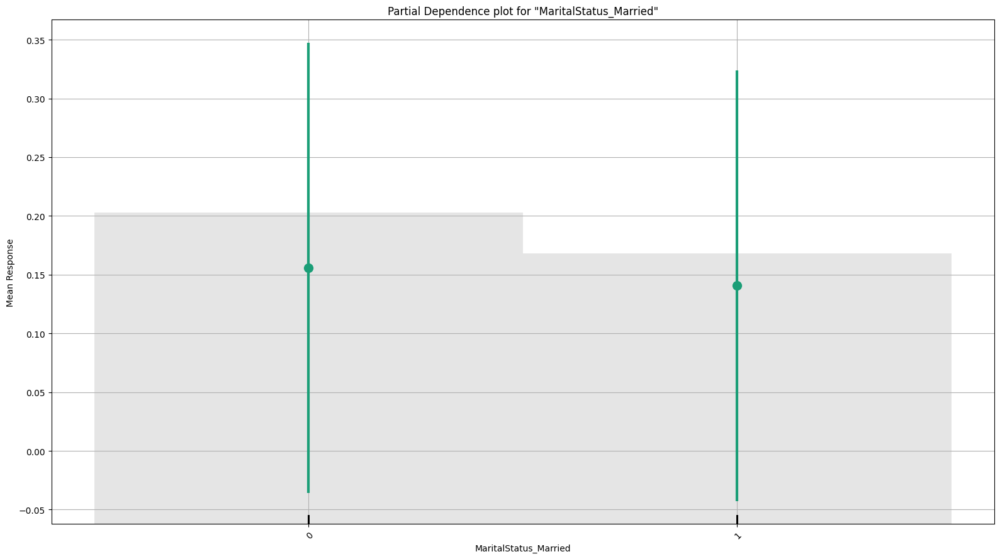

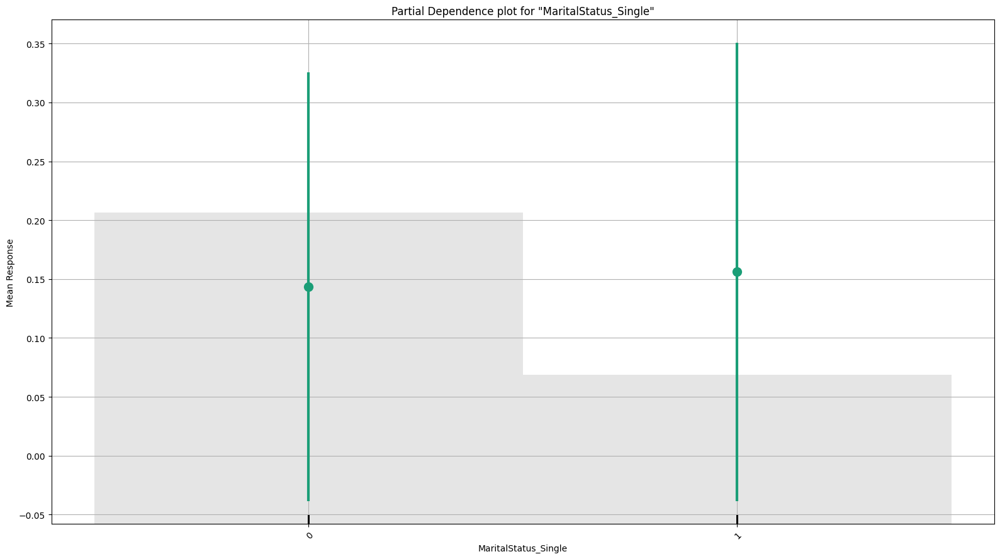

In [18]:
# Display test performance
test_best_model.explain(test)

# Saving Models

In [19]:
# Save models into folder

# Create a folder in the root directory
!mkdir -p "../models/allfeatures"

# Get current time
current_time = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

cv_model_path = "../models/allfeatures/"+current_time+"/cv"
test_model_path = "../models/allfeatures/"+current_time+"/test"
cv_lb_path = "../models/allfeatures/"+current_time+"/cv_lb.csv"
test_lb_path = "../models/allfeatures/"+current_time+"/test_lb.csv"

cv_leader_model_path = h2o.save_model(model=cv_best_model, path=cv_model_path, force=True)
test_leader_model_path = h2o.save_model(model=test_best_model, path=test_model_path, force=True)
h2o.export_file(lb, path=cv_lb_path, force = True)
h2o.export_file(test_lb, path=test_lb_path, force = True)

print(current_time)
print(cv_leader_model_path)

# Documentation: https://docs.h2o.ai/h2o/latest-stable/h2o-docs/save-and-load-model.html

A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file ../models/allfeatures already exists.
Error occurred while processing: ../models/allfeatures.


Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
2025-03-26_20-50-35
D:\OneDrive\Repos\employee-attrition-ibm\models\allfeatures\2025-03-26_20-50-35\cv\StackedEnsemble_AllModels_1_AutoML_1_20250326_194124
